In [1]:
import vice

/astro/dboyea/.local/lib/python3.11/site-packages/vice-1.4.0.dev0-py3.11-linux-x86_64.egg/vice/__init__.py:141: UserWarning: Using un-released version of VICE
  warnings.warn("Using un-released version of VICE", UserWarning)


In [2]:
import numpy as np

In [3]:
import pandas as pd
import matplotlib.pyplot as plt
import surp

import surp.gce_math as gcem
import arya

In [4]:
%load_ext autoreload
%autoreload 2

In [5]:
import mc_plot_utils

In [6]:
from scipy.stats import binned_statistic

In [59]:
def plot_all(filename, props, test=False, burn=0, skip=100):
    y0 = props["y0"],
    y_a = props["y_a"]
    zeta_a = props["zeta_a"]
    
    if test:
        result = mc_plot_utils.MCMCResult.from_test_file(filename, burn=burn)
    else:
        result = mc_plot_utils.MCMCResult.from_file(filename, y0=y0, burn=burn, y_a=y_a, zeta_a=zeta_a)

    modeldir = "../models/perturbations/mc_analysis/"
    result.print_stats()
    mc_plot_utils.plot_yields(result)
    plt.savefig(modeldir + filename + "/yields.pdf")
    plt.show()
    
    fig = plt.figure(figsize=(6, 6))
    result.plot_corner(fig=fig)
    plt.savefig(modeldir + filename + "/corner.pdf")
    plt.show()

    mc_plot_utils.plot_samples_caah(result, skip=skip)
    mc_plot_utils.plot_obs_caah(result, color=arya.COLORS[1])
    plt.savefig(modeldir + filename + "/caah_samples.pdf")

    plt.show()

    mc_plot_utils.plot_samples_caafe(result, skip=skip)
    mc_plot_utils.plot_obs_caafe(result, color=arya.COLORS[1])
    plt.savefig(modeldir + filename + "/caafe_samples.pdf")

    plt.show()

    if y0 is not None:
        mc_plot_utils.plot_fagb_hist(result)
        plt.savefig(modeldir + filename + "/fagb_hist.pdf")

        
    return

In [41]:
vice.yields.agb.settings["c"] = surp.agb_interpolator.interpolator("c", mass_factor=0.5)
y0 = surp.yields.calc_y(kind="agb")
y0

0.0002832489228255587

In [42]:
for study in surp.AGB_MODELS:
    vice.yields.agb.settings["c"] = surp.agb_interpolator.interpolator("c", study=study)
    y0 = surp.yields.calc_y(Z=0.0176, kind="agb")
    print(f"{study:8s}\t{y0/1e-4:6.3f}")


cristallo11	 3.113
ventura13	-0.009
karakas16	 2.956
battino19	 9.248


In [43]:
df = pd.read_csv("yield_fits.tsv", sep=r"\s+", comment="#")
df

,model,y0,zeta0,zeta0_err,zeta1,zeta1_err
0,fruity,3.110,3.7,0.3,-3.5,0.3
1,aton,-0.009,1.0,1.9,-10.0,3.0
2,monash,2.960,2.3,0.5,-11.0,1.0
3,nugrid,9.250,8.1,1.9,-4.6,1.7
4,fruity_mf0.5,2.830,3.3,0.2,-1.8,0.2
5,fruity_mf0.7,3.600,4.2,0.3,-3.1,0.3
6,fruity_mf1.5,3.110,3.4,0.2,-3.0,0.2


In [44]:
yagb_props = {}

for _, row in df.iterrows():
    yagb_props[row.model] = {
        "y0": row.y0 * 1e-4,
        "y_a": row.zeta0 * 1e-4,
        "zeta_a": row.zeta1 * 1e-4,
    }

yagb_props["analytic"] = {
    "y0": 1e-3,
    "y_a": 1e-3,
    "zeta_a": 1e-3
}

yagb_props

{'fruity': {'y0': 0.000311, 'y_a': 0.00037000000000000005, 'zeta_a': -0.00035},
 'aton': {'y0': -9e-07, 'y_a': 0.0001, 'zeta_a': -0.001},
 'monash': {'y0': 0.000296, 'y_a': 0.00022999999999999998, 'zeta_a': -0.0011},
 'nugrid': {'y0': 0.000925, 'y_a': 0.00081, 'zeta_a': -0.00045999999999999996},
 'fruity_mf0.5': {'y0': 0.000283, 'y_a': 0.00033, 'zeta_a': -0.00018},
 'fruity_mf0.7': {'y0': 0.00036, 'y_a': 0.00042, 'zeta_a': -0.00031},
 'fruity_mf1.5': {'y0': 0.000311,
  'y_a': 0.00034,
  'zeta_a': -0.00030000000000000003},
 'analytic': {'y0': 0.001, 'y_a': 0.001, 'zeta_a': 0.001}}

# Body

## Main comparisons

length of samples =  48000
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 2.408	-0.263	+0.263	-0.860	+0.789
y0_cc   	 1.896	-0.094	+0.095	-0.285	+0.310
zeta_cc 	 2.275	-0.160	+0.155	-0.533	+0.518
A_cc    	 2.583	-0.301	+0.306	-0.986	+1.052
sigma_int	 0.085	-0.015	+0.018	-0.037	+0.070


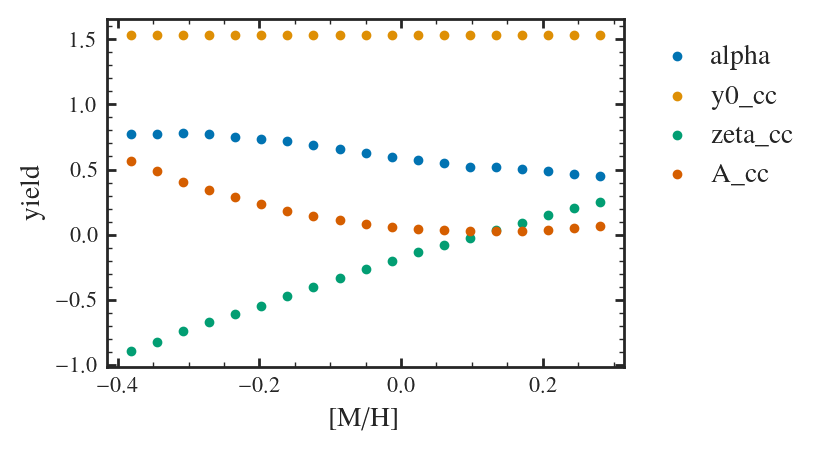

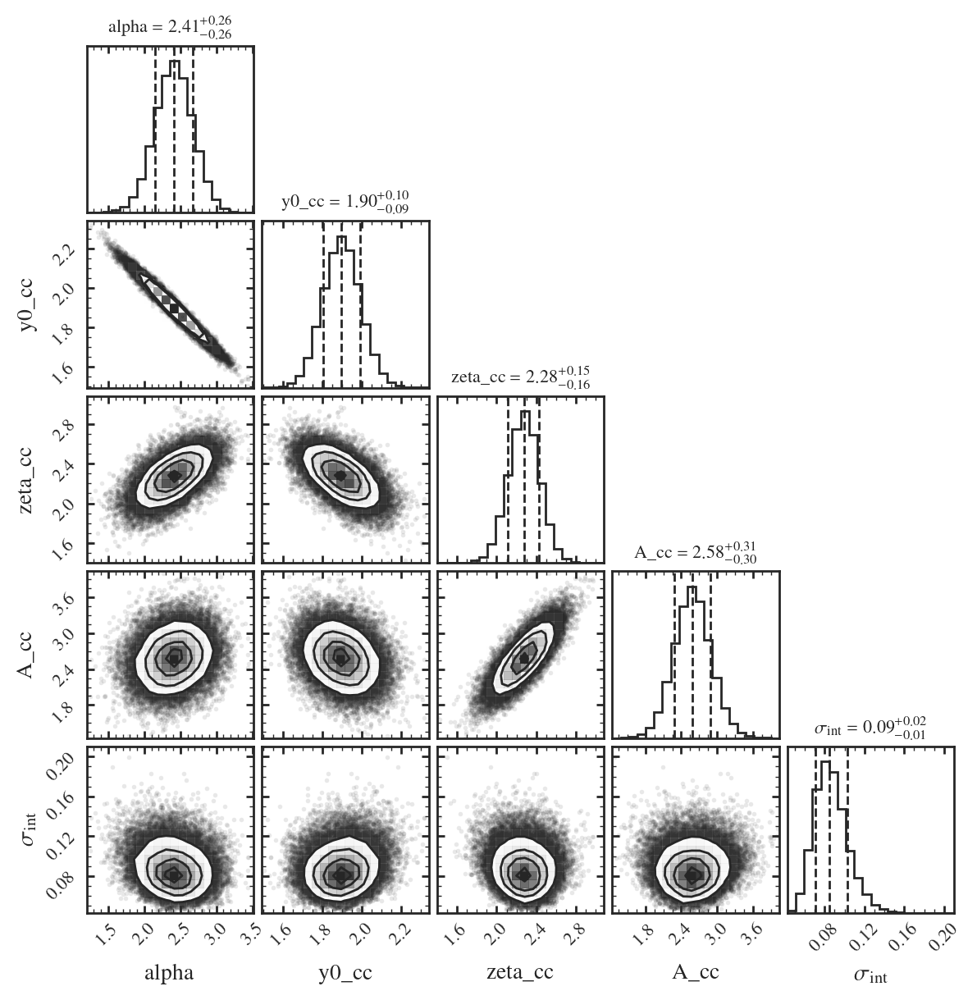

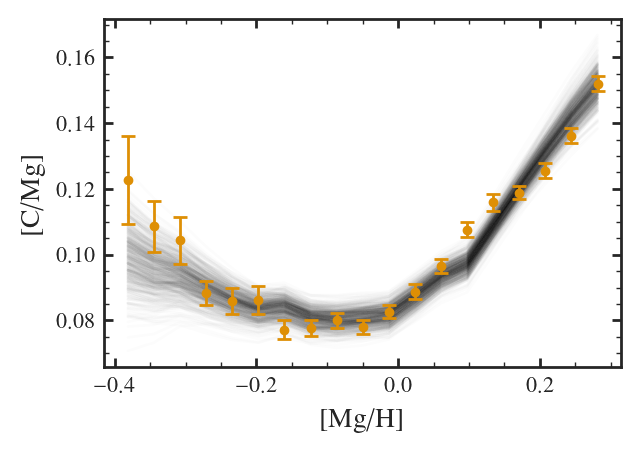

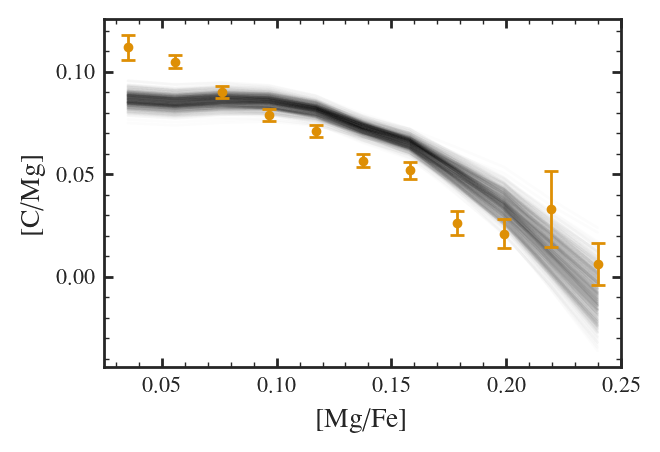

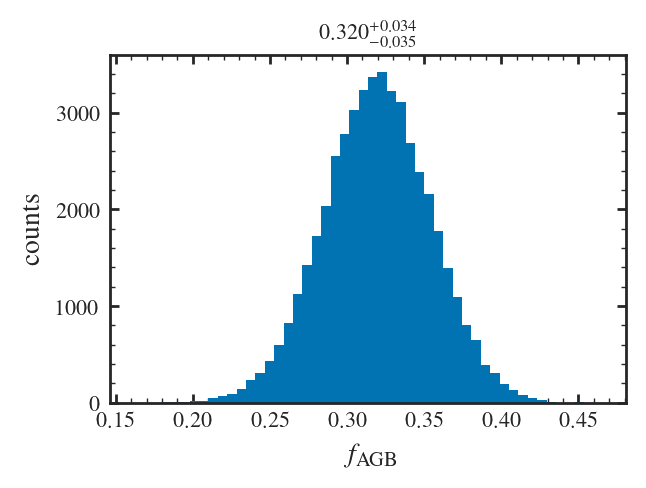

In [60]:
plot_all("fiducial", yagb_props["fruity"])

length of samples =  48000
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 0.536	-0.039	+0.039	-0.124	+0.129
y0_cc   	 2.223	-0.042	+0.041	-0.137	+0.126
zeta_cc 	 1.432	-0.080	+0.080	-0.266	+0.277
A_cc    	 2.480	-0.211	+0.222	-0.680	+0.743
sigma_int	 0.049	-0.009	+0.011	-0.025	+0.046


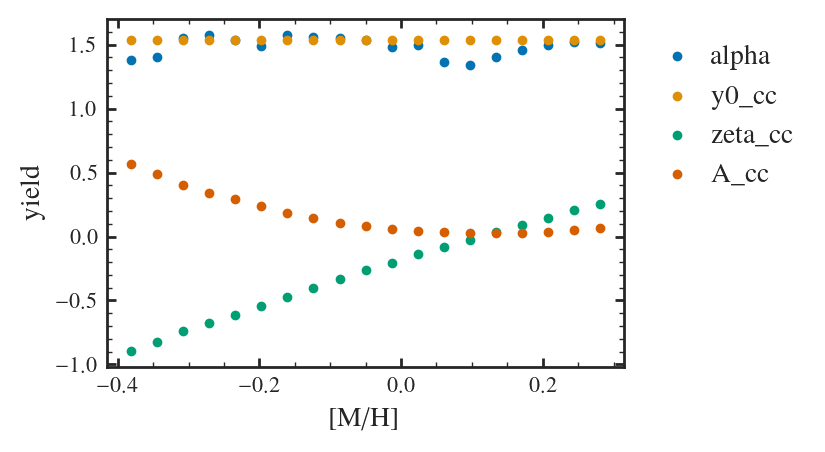

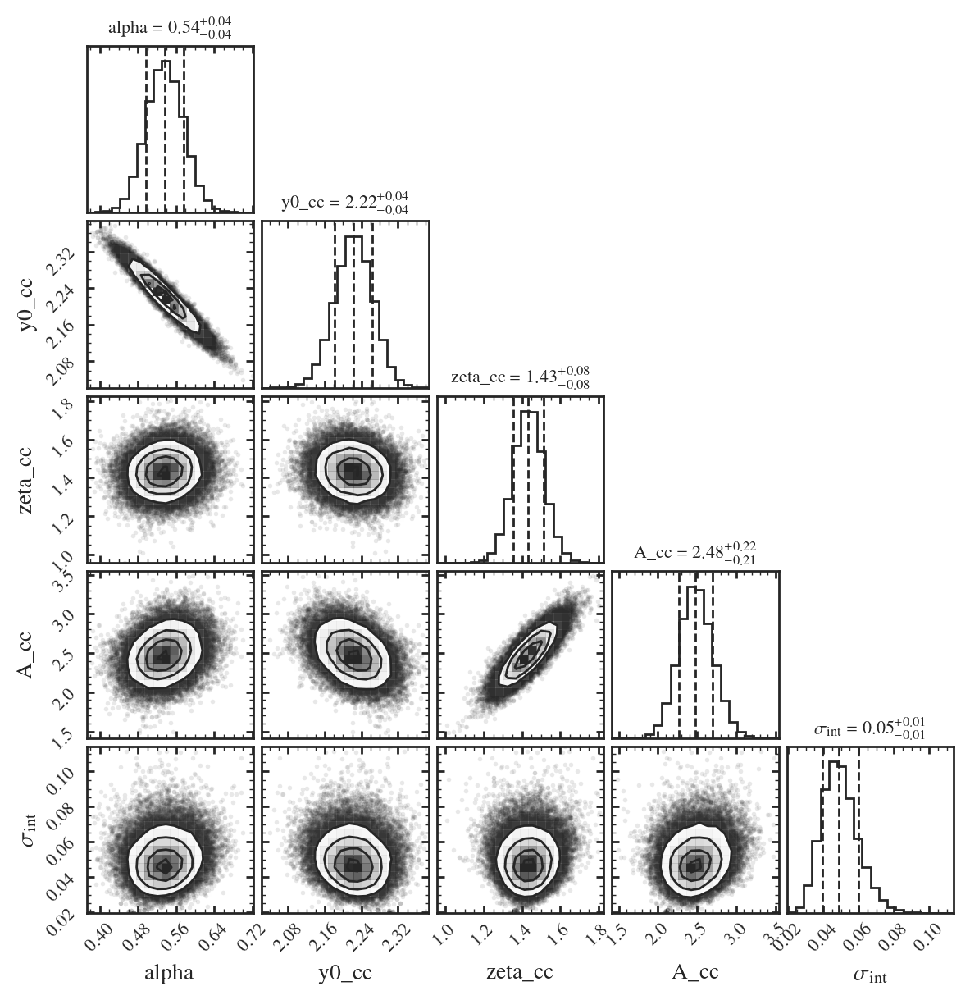

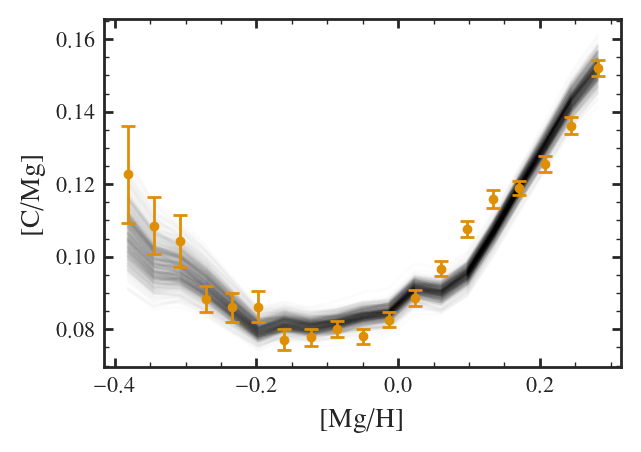

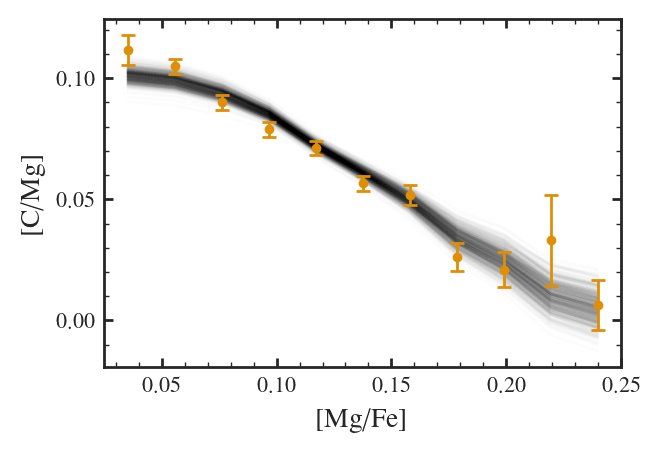

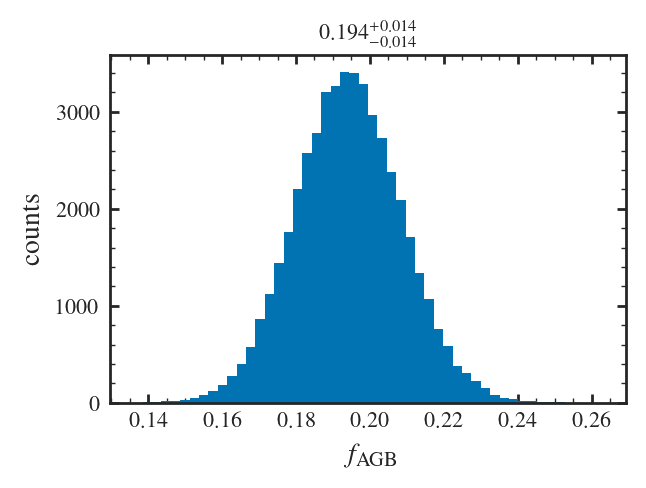

In [61]:
plot_all("analytic_quad", yagb_props["analytic"])

length of samples =  48000
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 0.526	-0.038	+0.039	-0.119	+0.126
y0_cc   	 2.234	-0.041	+0.039	-0.135	+0.124
zeta_cc 	 1.430	-0.082	+0.081	-0.271	+0.266
A_cc    	 2.463	-0.213	+0.221	-0.681	+0.731
sigma_int	 0.049	-0.009	+0.011	-0.024	+0.045


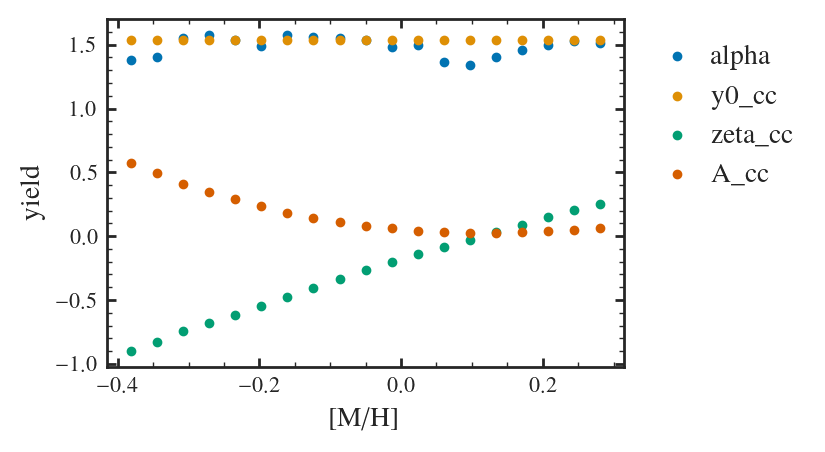

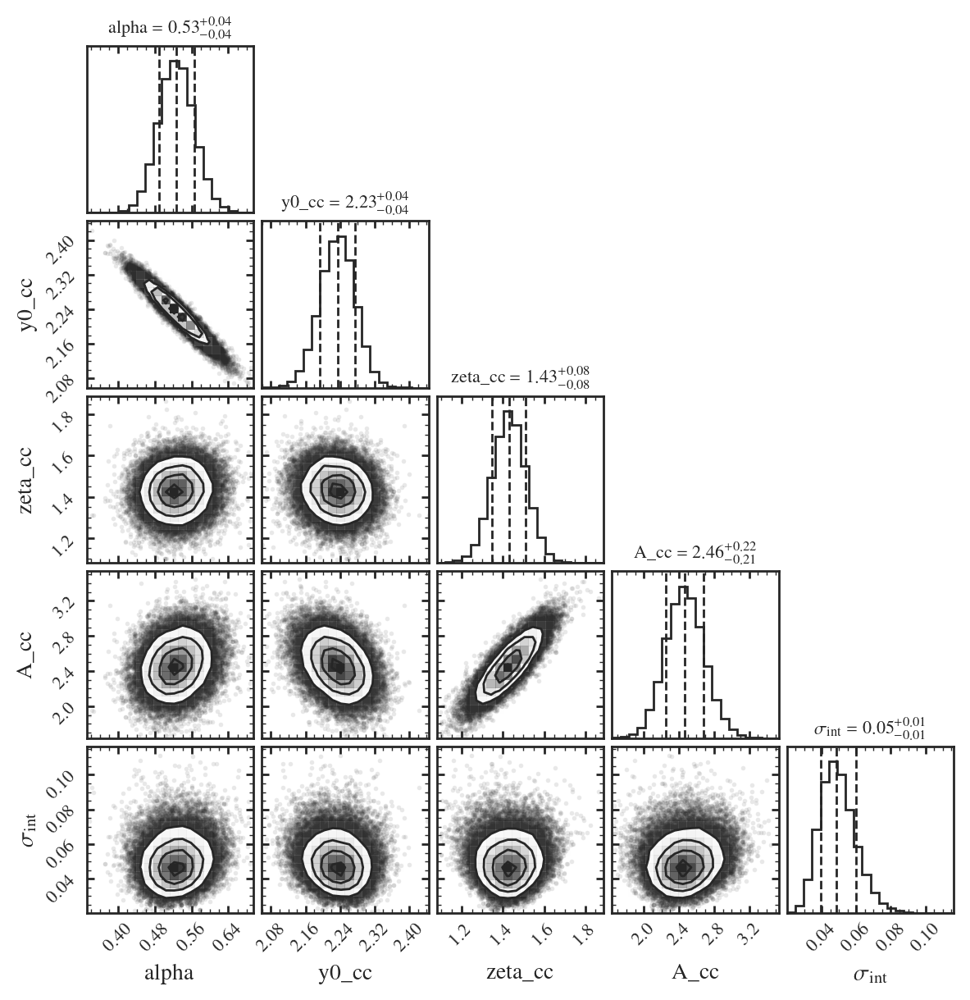

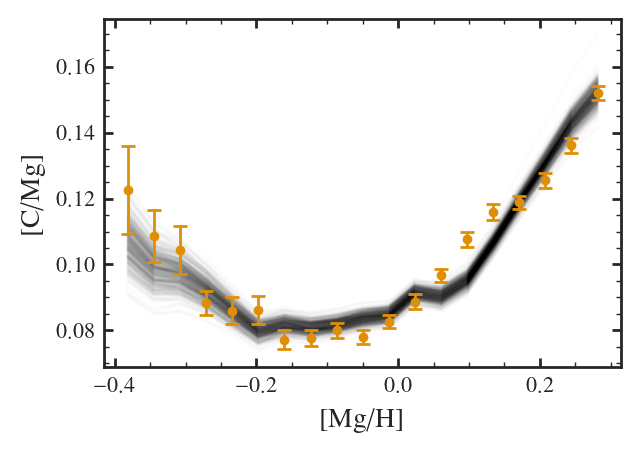

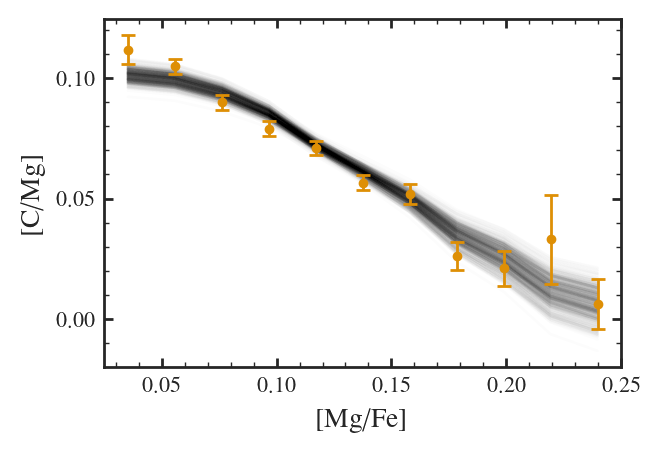

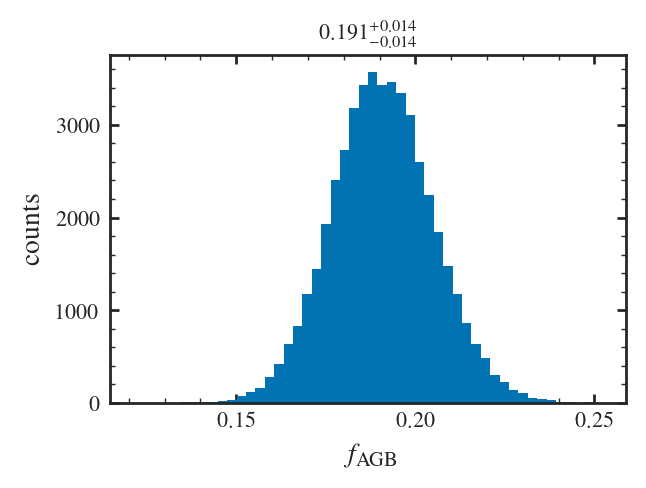

In [62]:
plot_all("analytic_all", yagb_props["analytic"])

The fiducial model should be exactly the same as the analytic model. The only difference is the fiducial model uses a single vice simulation instead of compositing several different in the case of the analytic. The analytic formulation makes it easier to add additional yield models, but the fiducial formulation makes exploring GCE uncertanties more efficient. In this notebook, all methods are read in and analyzed identically..

what happens if we remove the \[alpha/Fe\] component of the likelihood?

length of samples =  160000
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	-0.461	-0.446	+0.453	-1.373	+1.443
y0_cc   	 2.894	-0.156	+0.155	-0.498	+0.475
zeta_cc 	 1.242	-0.159	+0.160	-0.487	+0.504
A_cc    	 2.569	-0.122	+0.123	-0.379	+0.383


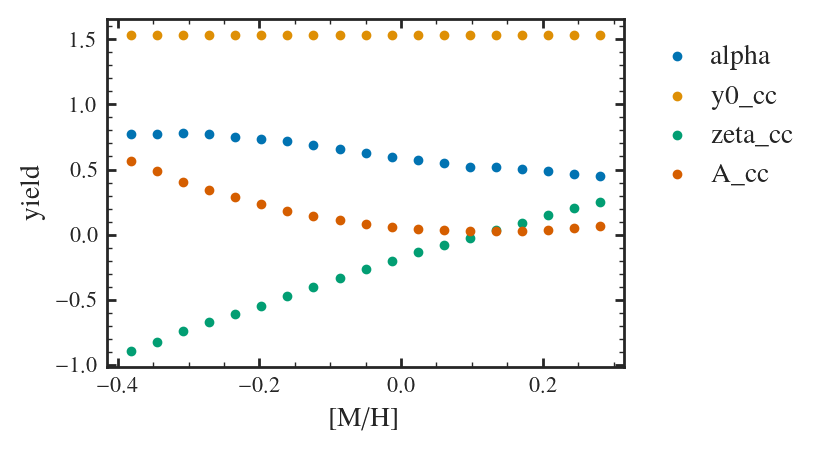

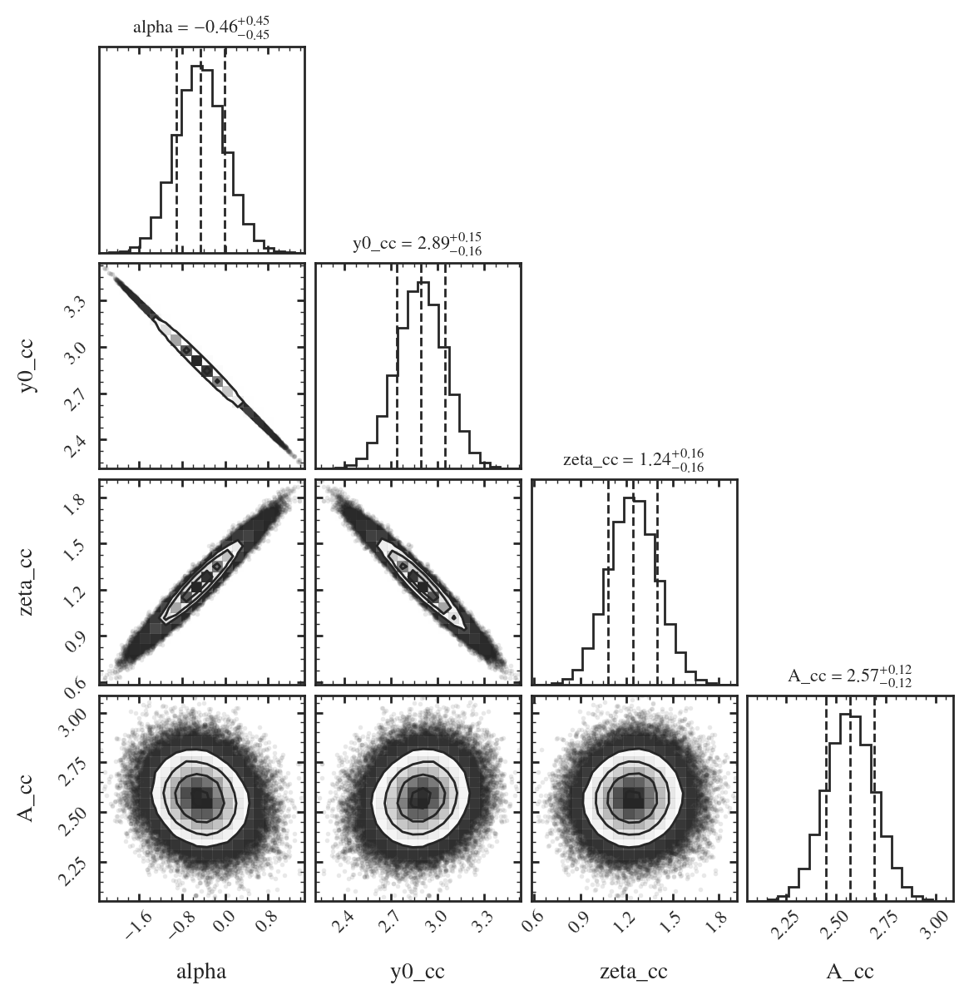

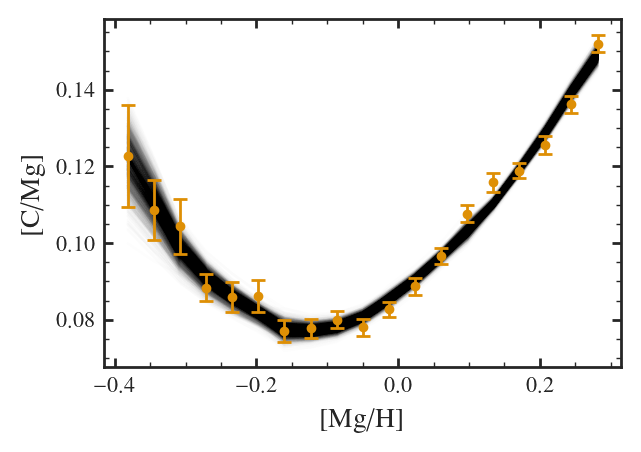

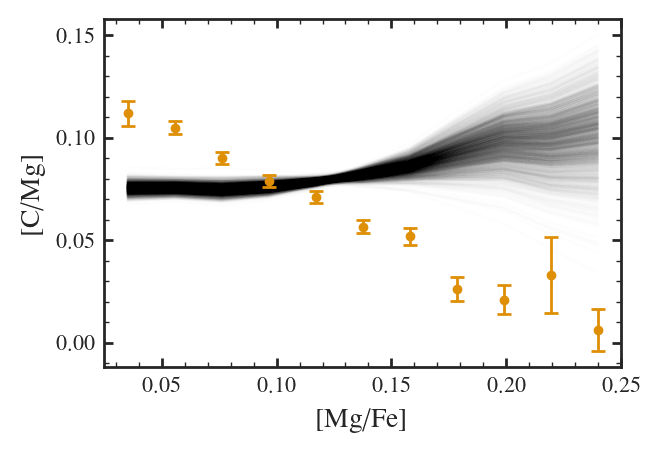

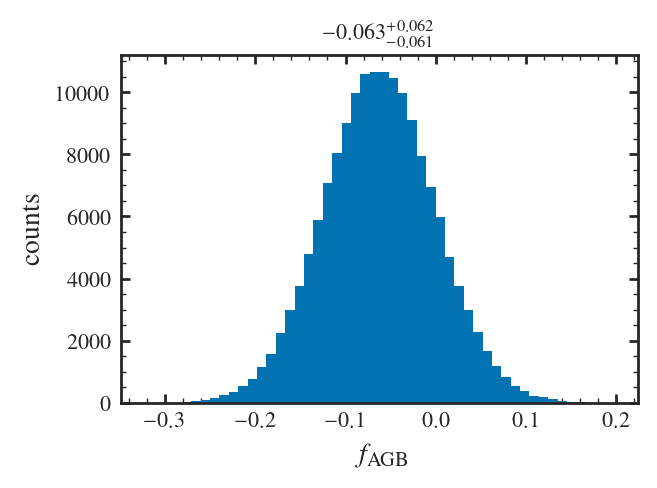

In [63]:
plot_all("fiducial_caah_only", yagb_props["fruity"])

length of samples =  48000
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 2.515	-0.251	+0.247	-0.848	+0.793
y0_cc   	 1.834	-0.087	+0.089	-0.281	+0.297
zeta_cc 	 1.997	-0.124	+0.121	-0.427	+0.406
A_cc    	 2.408	-0.287	+0.294	-0.931	+1.043
sigma_int	 0.077	-0.014	+0.017	-0.043	+0.070


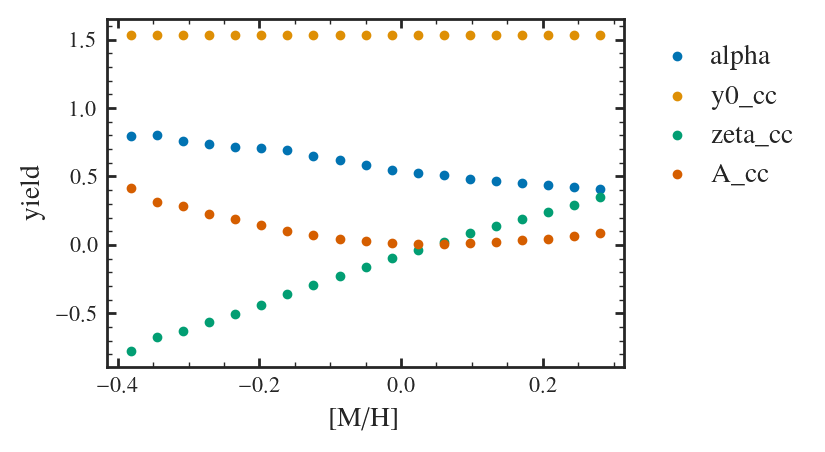

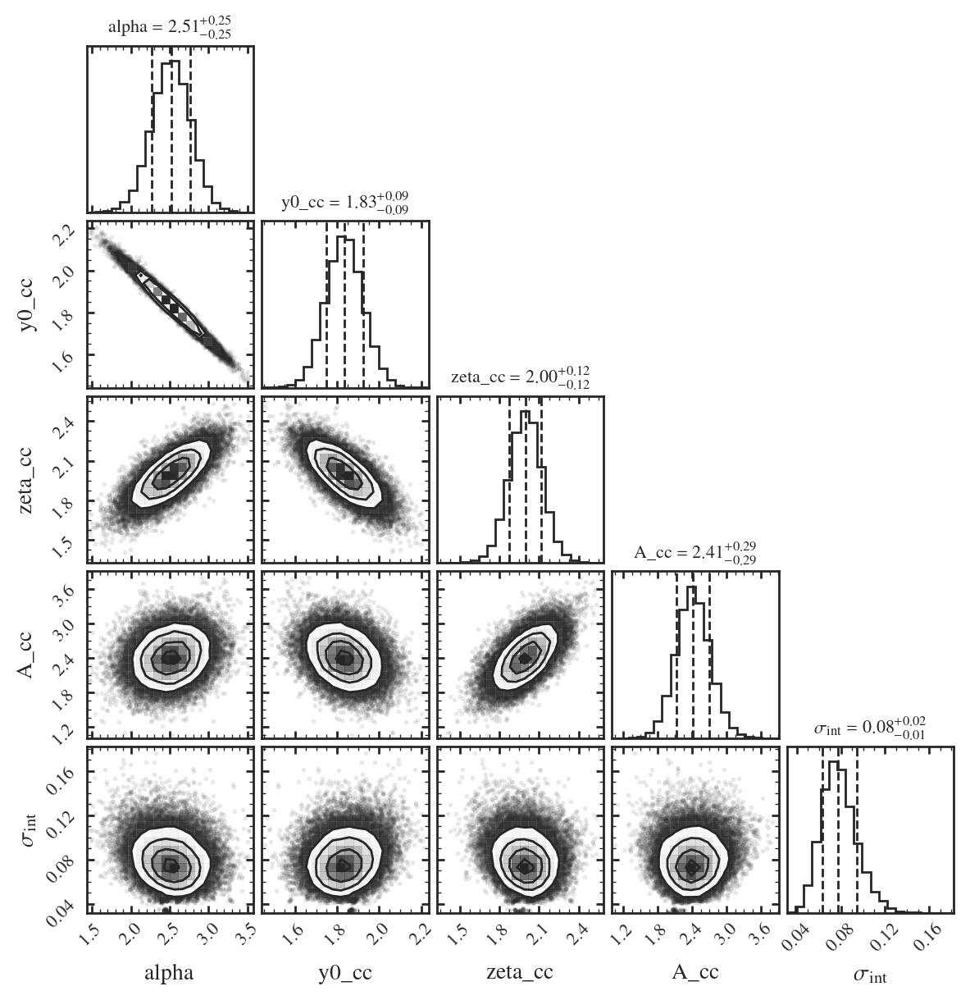

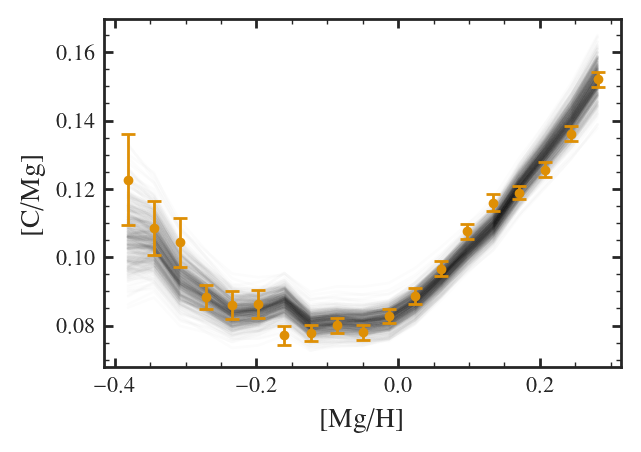

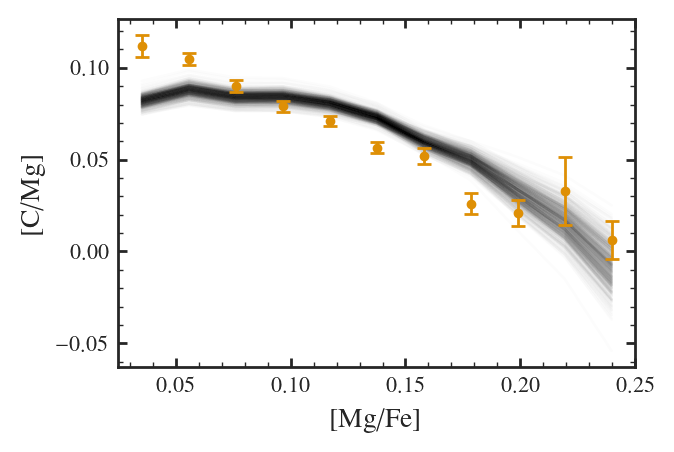

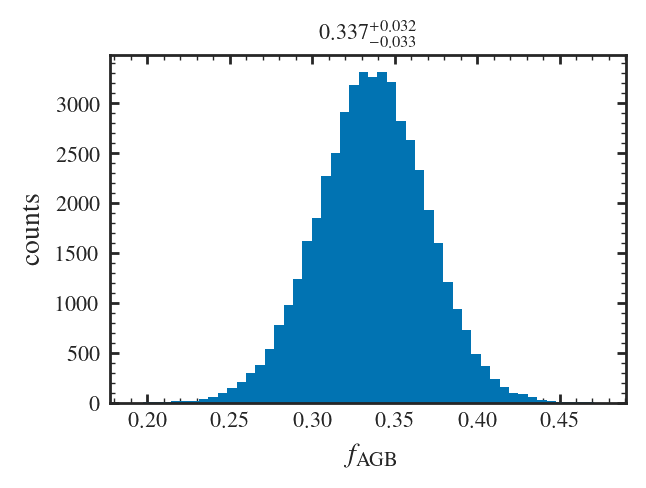

In [78]:
plot_all("eta2", yagb_props["fruity"])

length of samples =  48000
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 2.408	-0.359	+0.351	-1.173	+1.103
y0_cc   	 2.003	-0.119	+0.120	-0.369	+0.391
zeta_cc 	 2.915	-0.343	+0.337	-1.180	+1.103
A_cc    	 3.514	-0.650	+0.657	-2.198	+2.226
sigma_int	 0.125	-0.018	+0.023	-0.046	+0.092


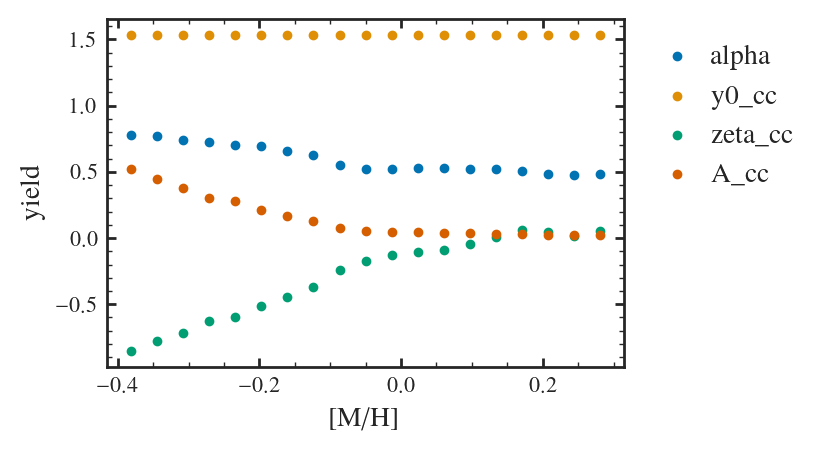

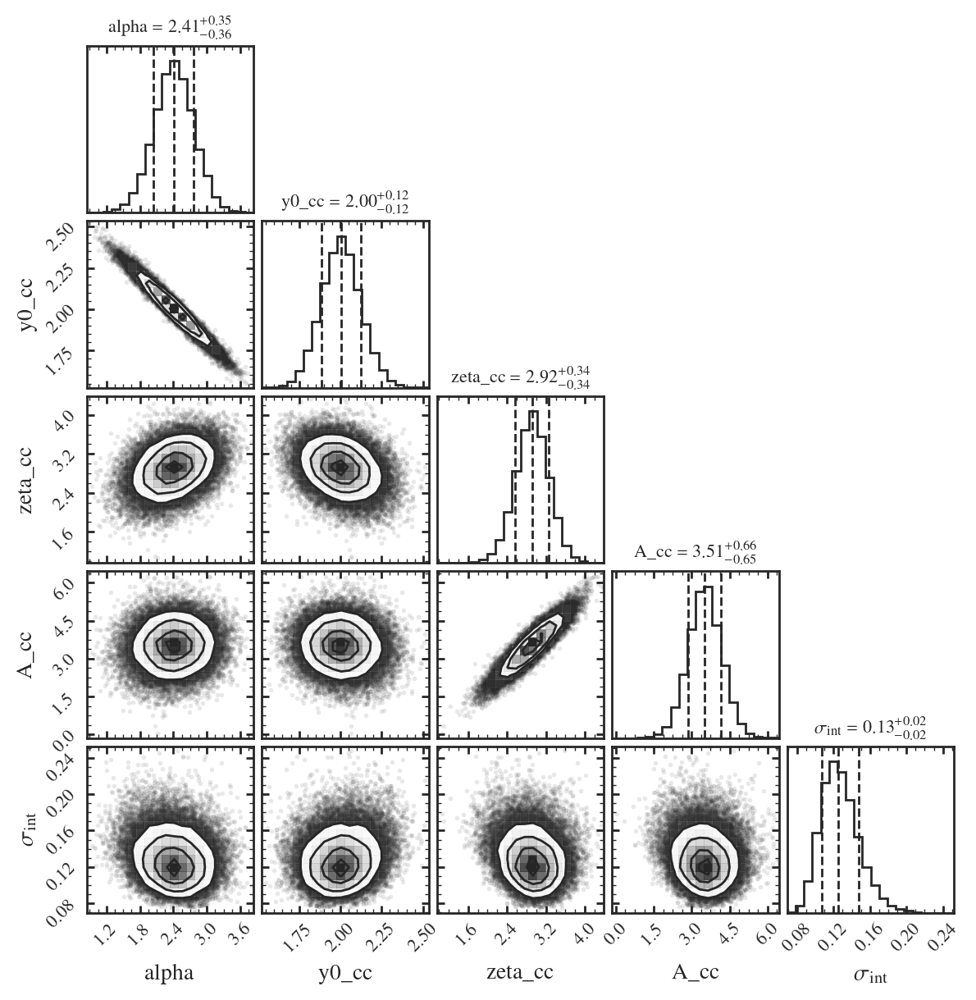

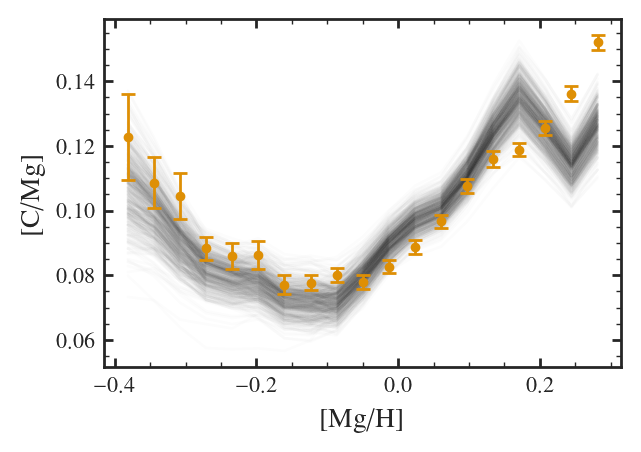

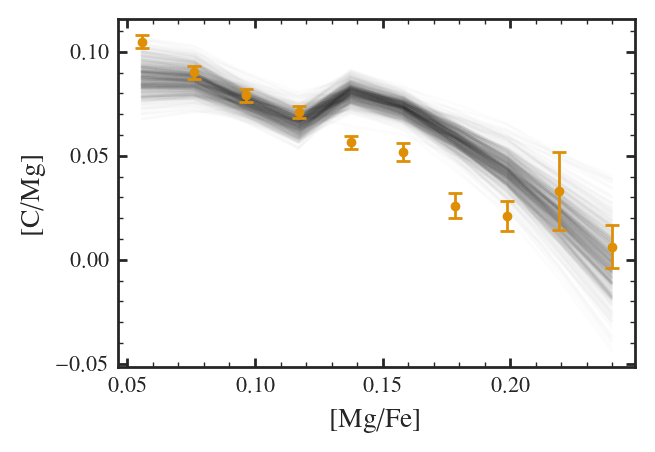

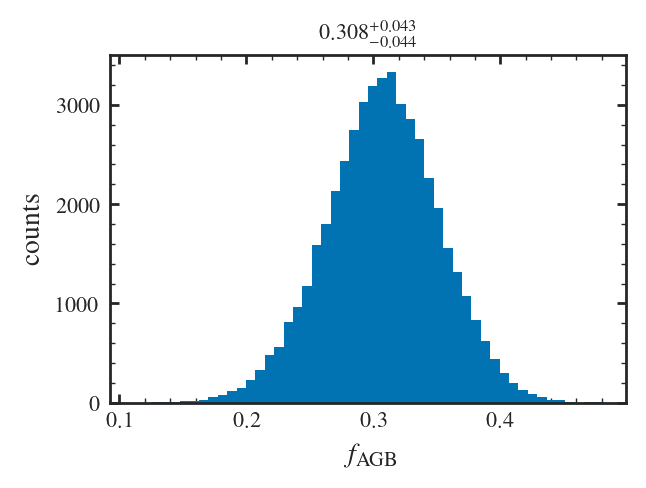

In [65]:
plot_all("lateburst", yagb_props["fruity"])

length of samples =  48000
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 2.030	-0.214	+0.211	-0.711	+0.688
y0_cc   	 2.047	-0.075	+0.076	-0.243	+0.247
zeta_cc 	 2.654	-0.202	+0.199	-0.674	+0.661
A_cc    	 3.518	-0.355	+0.353	-1.159	+1.151
sigma_int	 0.087	-0.015	+0.018	-0.037	+0.070


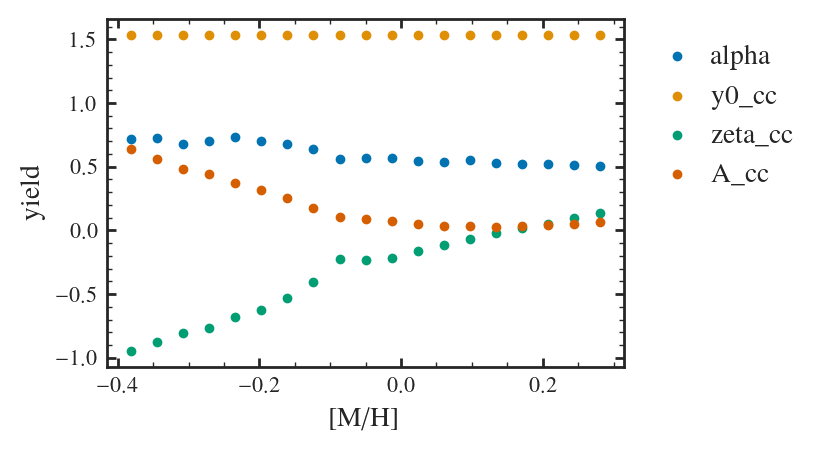

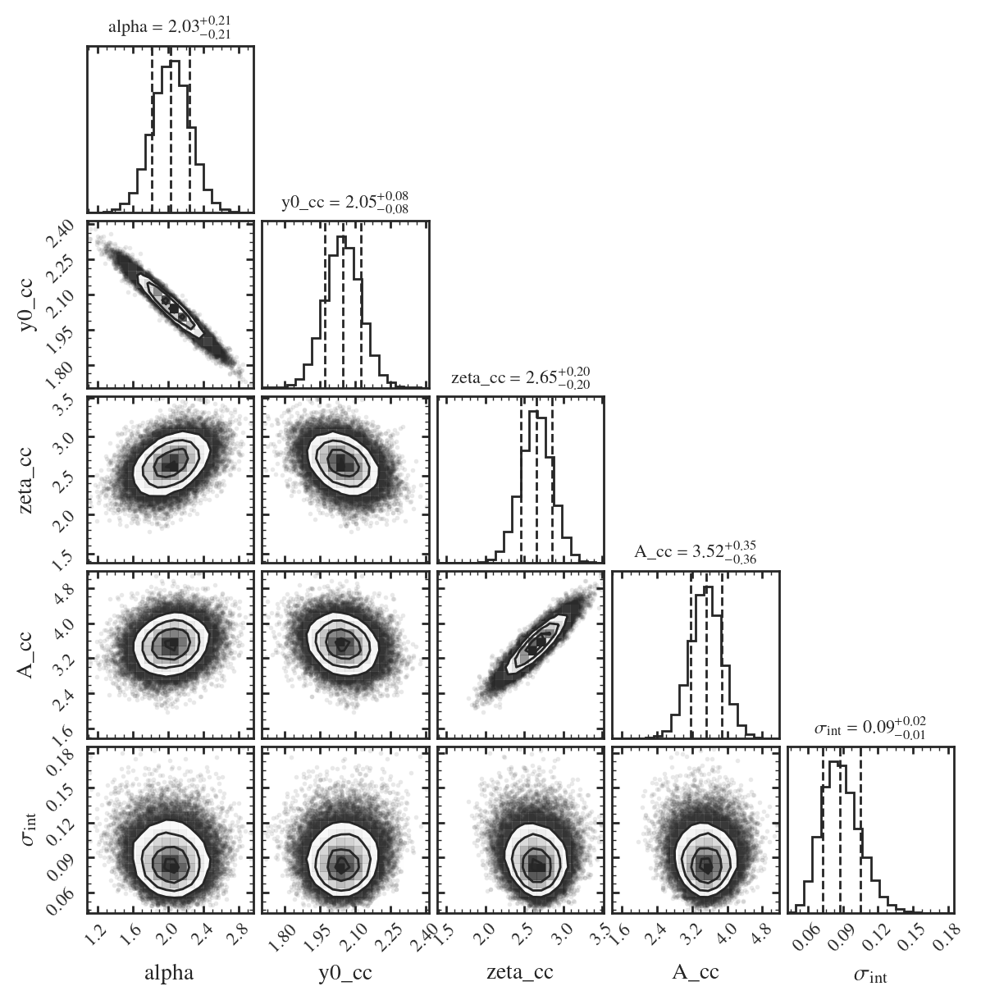

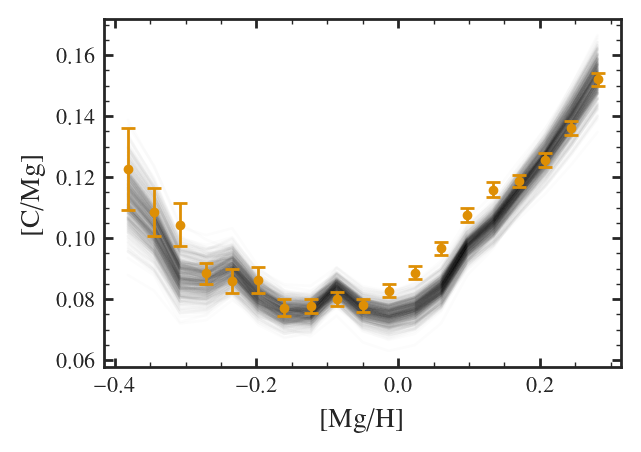

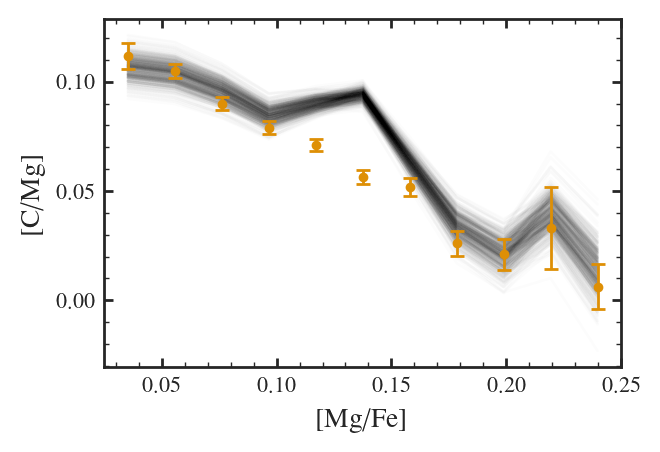

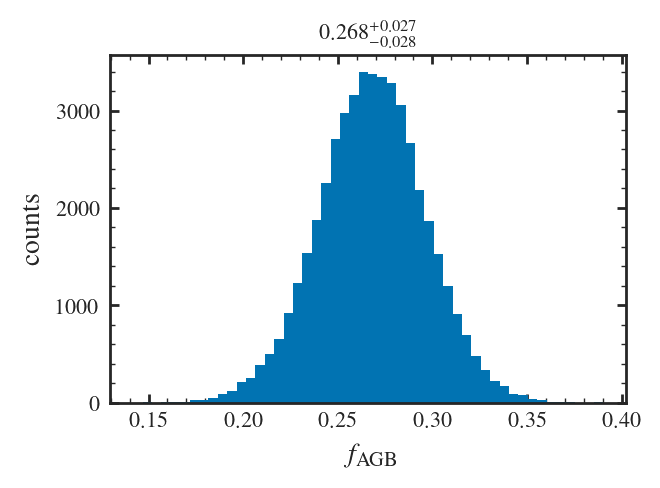

In [66]:
plot_all("twoinfall", yagb_props["fruity"])

length of samples =  48000
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 3.288	-0.447	+0.429	-1.493	+1.298
y0_cc   	 1.571	-0.154	+0.161	-0.471	+0.532
zeta_cc 	 2.730	-0.230	+0.215	-0.805	+0.664
A_cc    	 2.723	-0.349	+0.350	-1.166	+1.160
sigma_int	 0.098	-0.016	+0.020	-0.042	+0.081


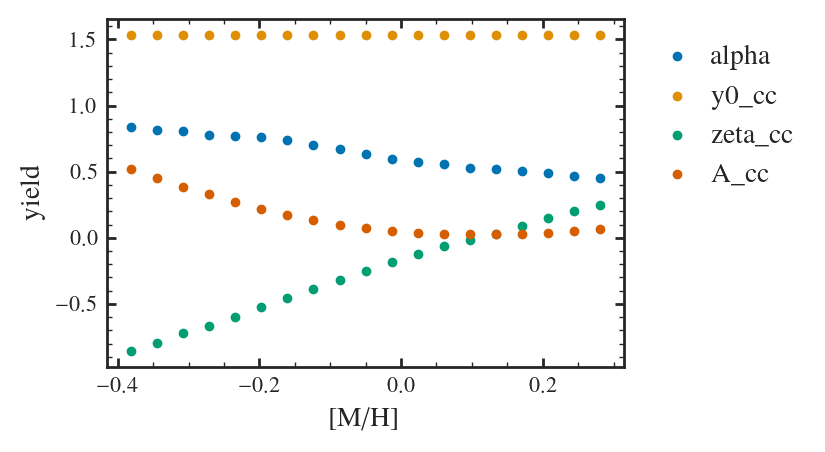

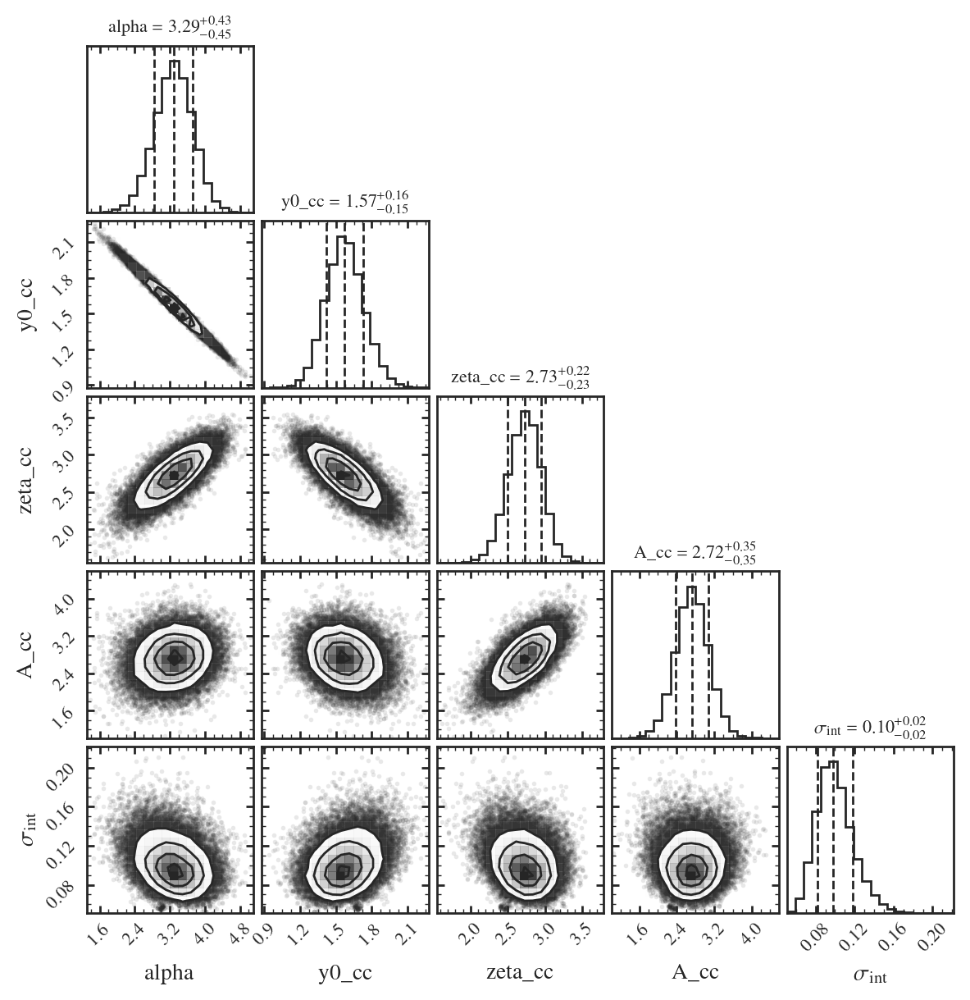

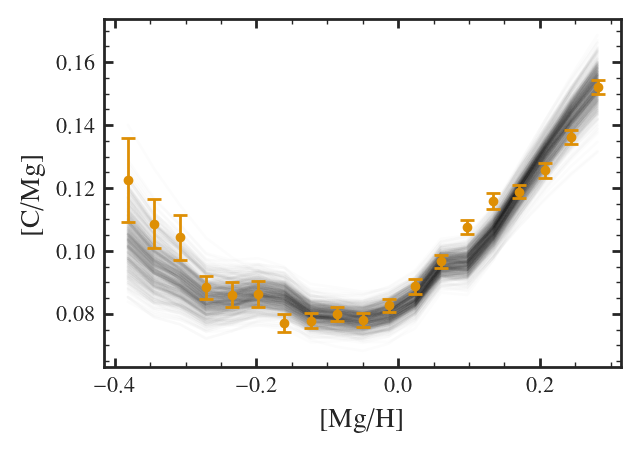

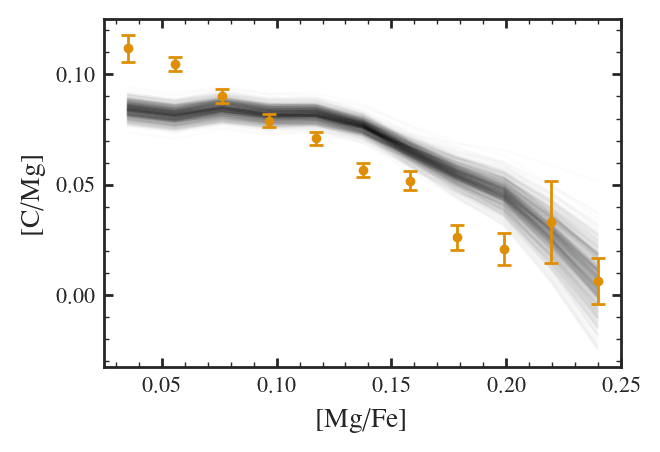

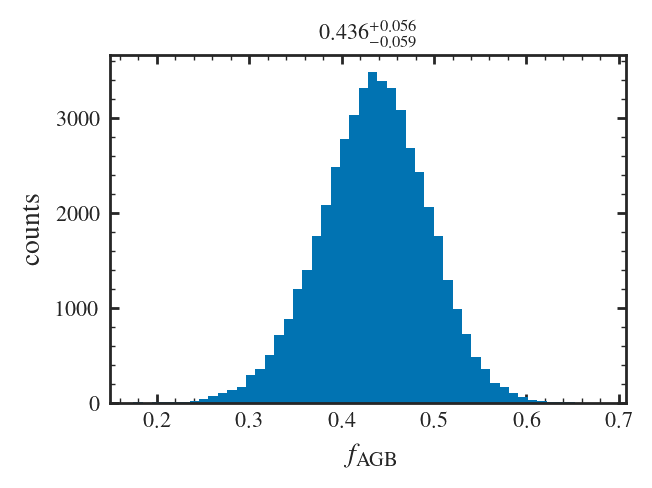

In [67]:
plot_all("snia_1.2", yagb_props["fruity"])

In [ ]:
plot_all("fiducial_old_migration", yagb_props["fruity"])

length of samples =  48000
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 1.694	-0.222	+0.217	-0.743	+0.748
y0_cc   	 2.071	-0.087	+0.088	-0.301	+0.295
zeta_cc 	 2.267	-0.162	+0.163	-0.563	+0.577
A_cc    	 3.189	-0.317	+0.329	-1.032	+1.183
sigma_int	 0.093	-0.016	+0.019	-0.041	+0.075


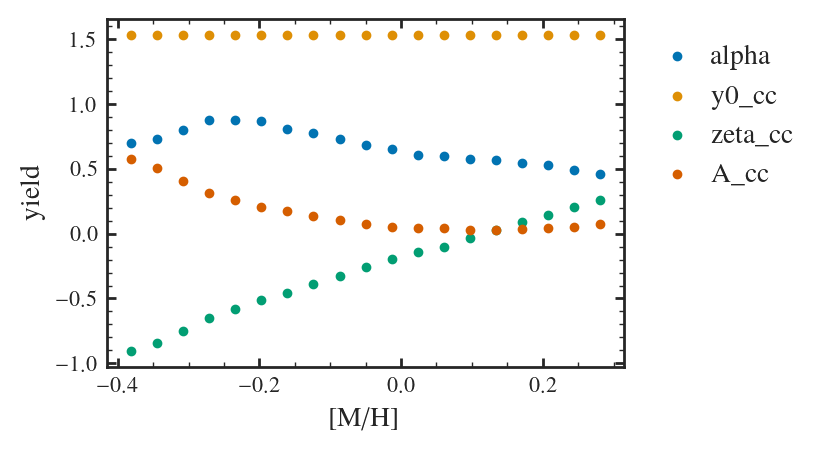

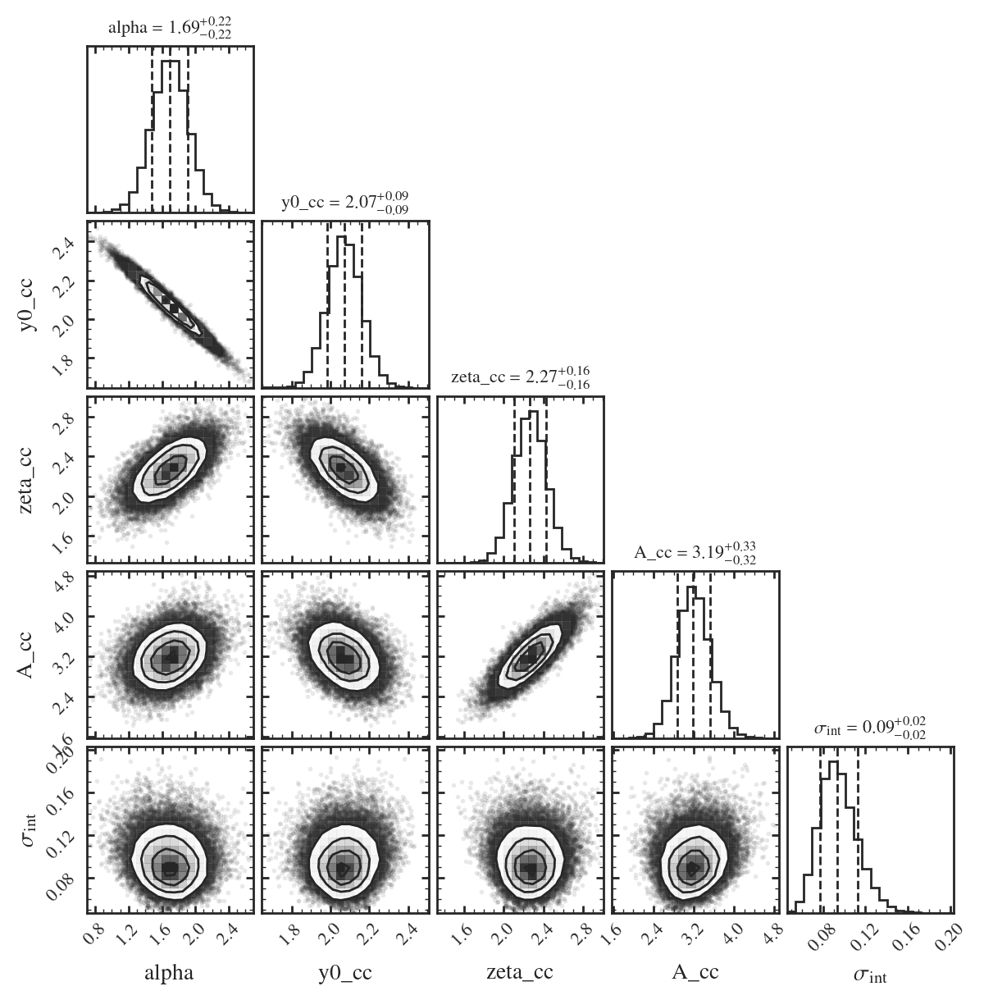

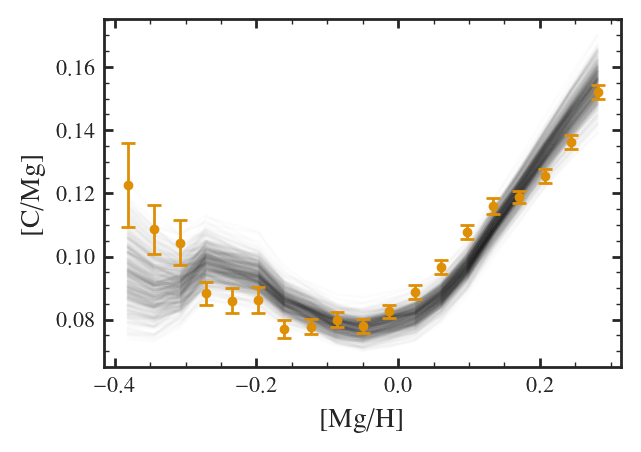

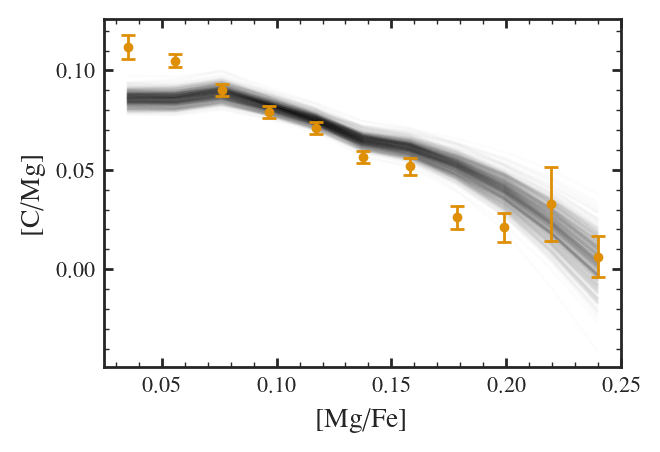

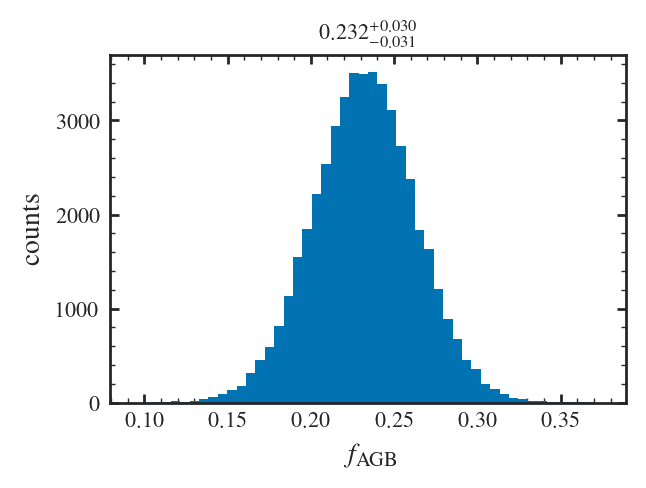

In [84]:
plot_all("hydrodisk", yagb_props["fruity"])

length of samples =  48000
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 1.011	-0.992	+1.000	-3.057	+3.056
y0_cc   	 2.744	-0.039	+0.039	-0.139	+0.133
zeta_cc 	 1.550	-0.288	+0.285	-0.986	+0.997
A_cc    	 2.394	-0.612	+0.610	-2.110	+2.125
sigma_int	 0.202	-0.027	+0.034	-0.068	+0.134


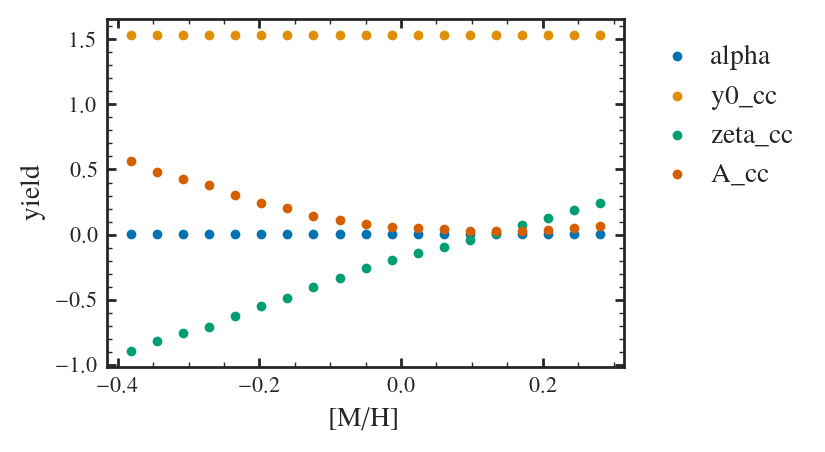

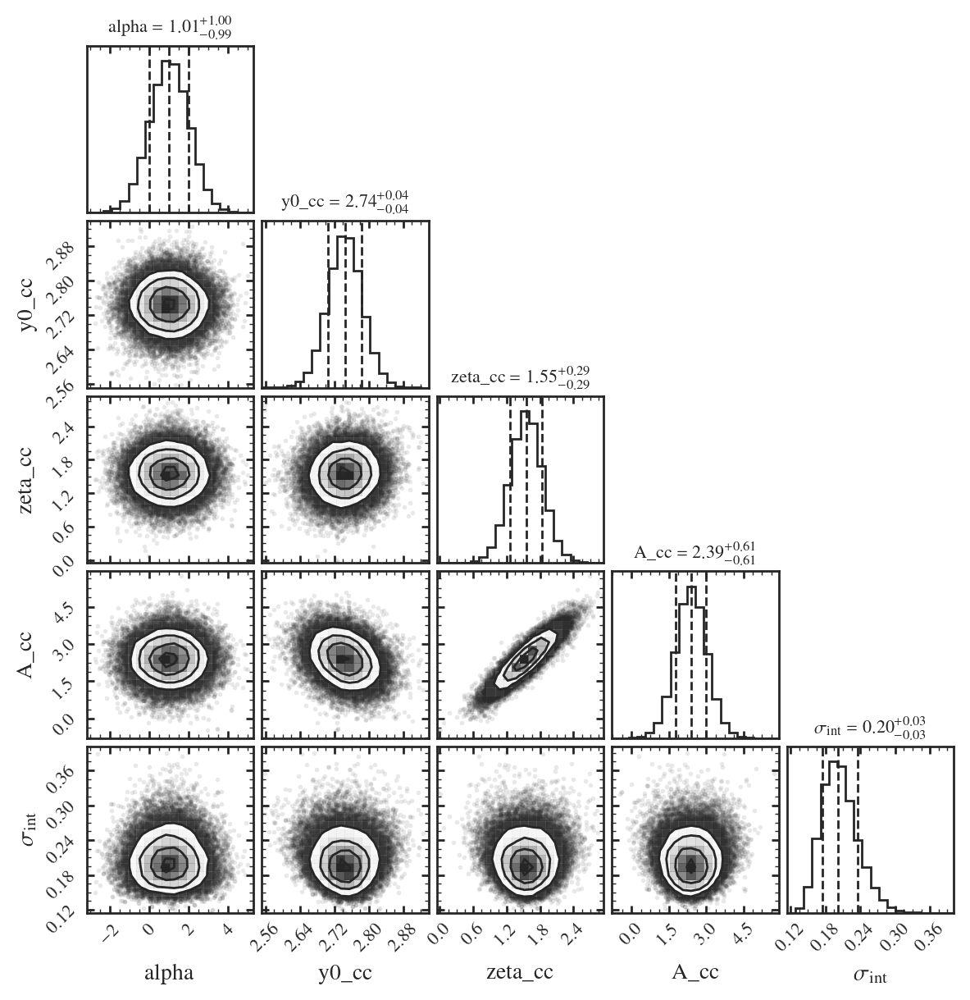

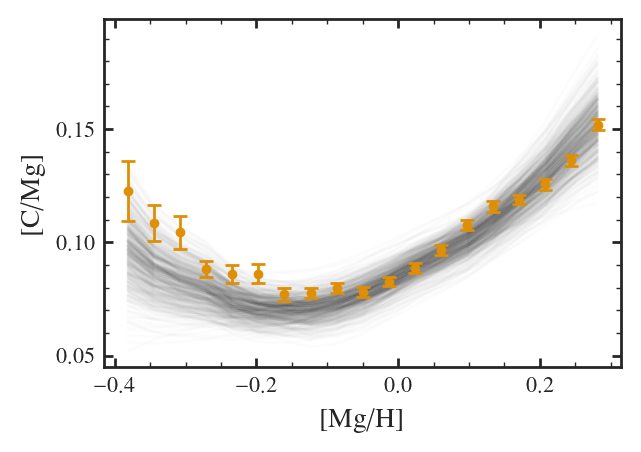

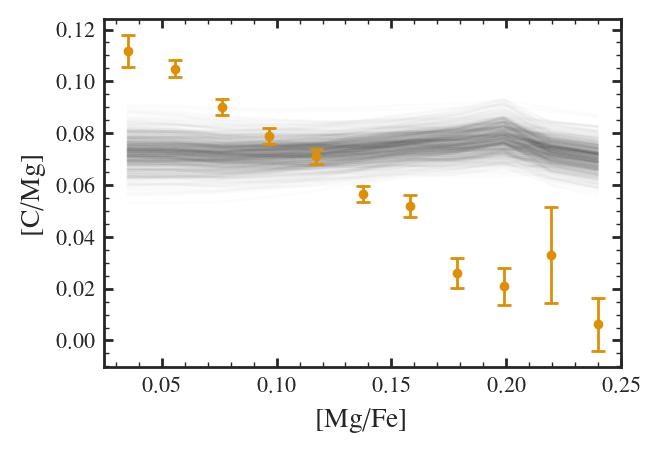

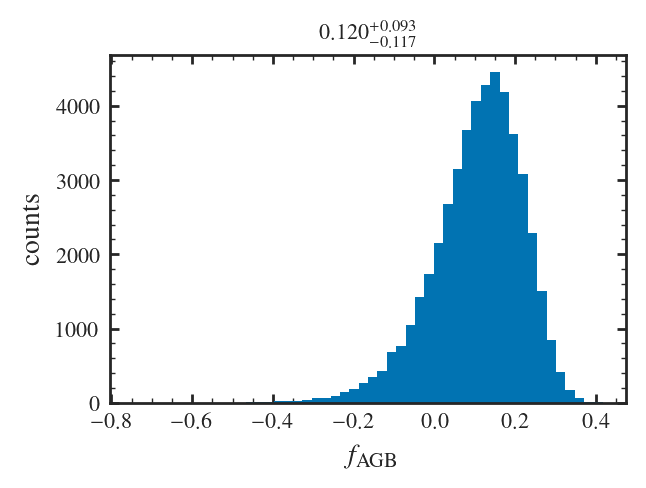

In [86]:
plot_all("rand_walk", yagb_props["fruity"])

adding  alpha
length of samples =  48000
parameter	 med	 16th	 84th	0.1th	99.9th
y0_cc   	 2.205	-0.034	+0.034	-0.113	+0.114
zeta_cc 	 1.126	-0.234	+0.234	-0.770	+0.767
A_cc    	 2.448	-0.521	+0.518	-1.679	+1.671
sigma_int	 0.170	-0.022	+0.027	-0.055	+0.111
alpha   	 2.690


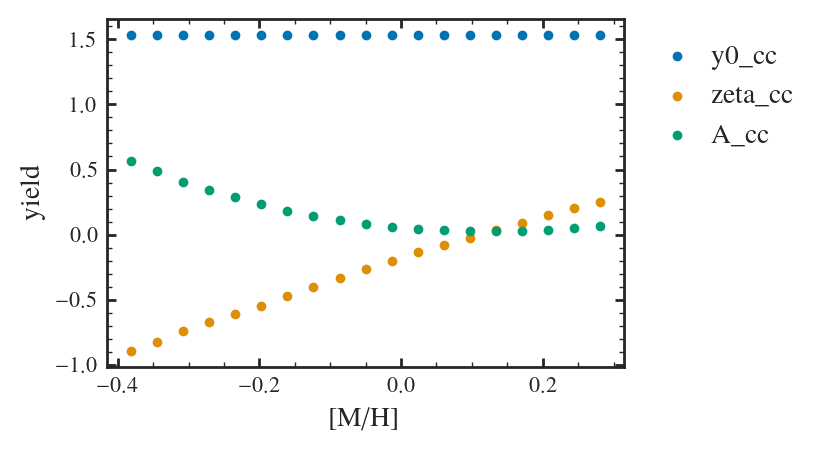

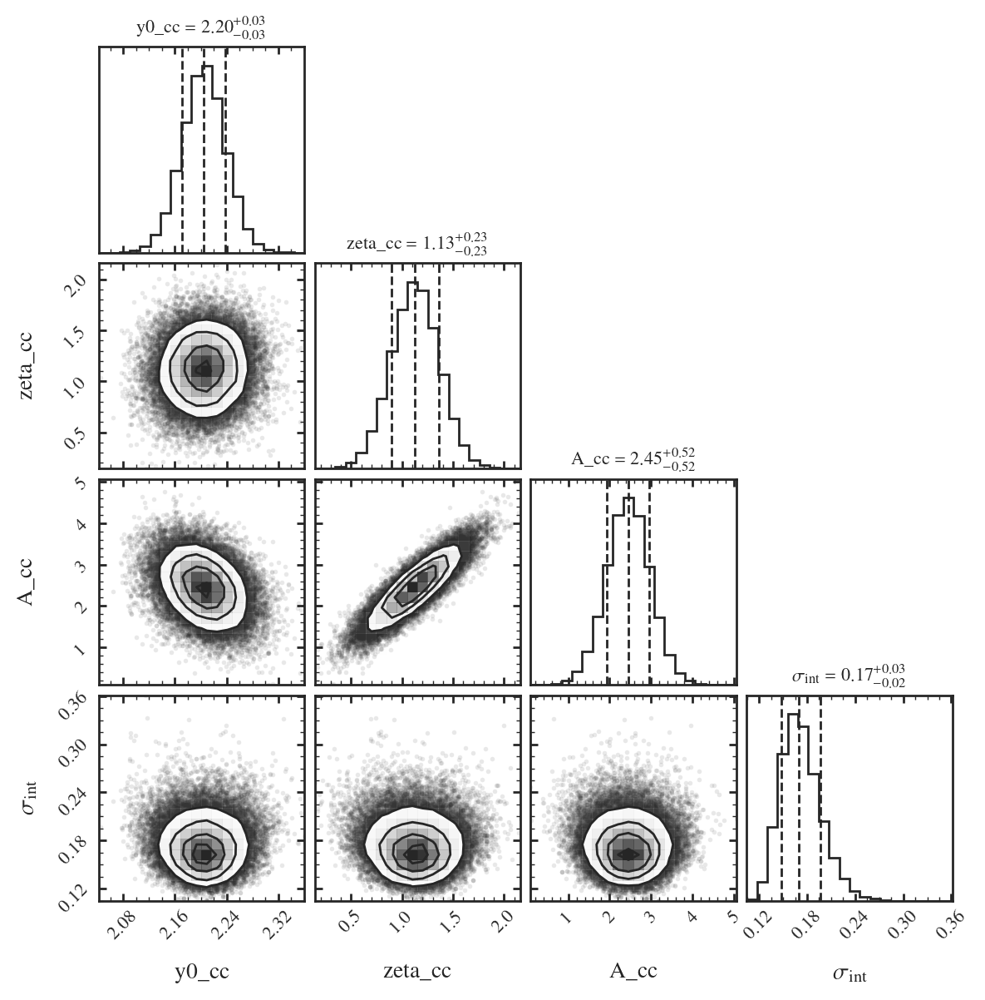

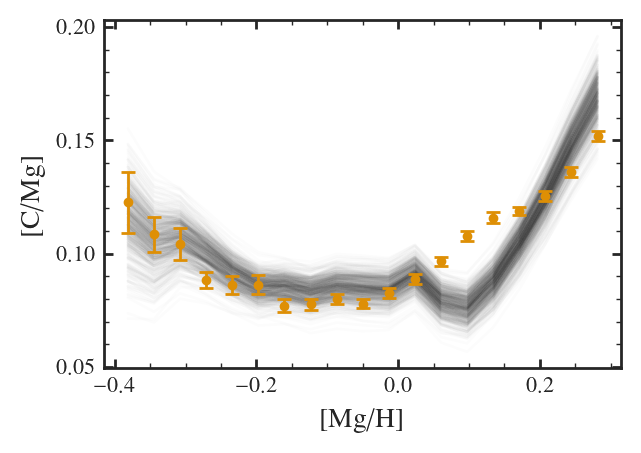

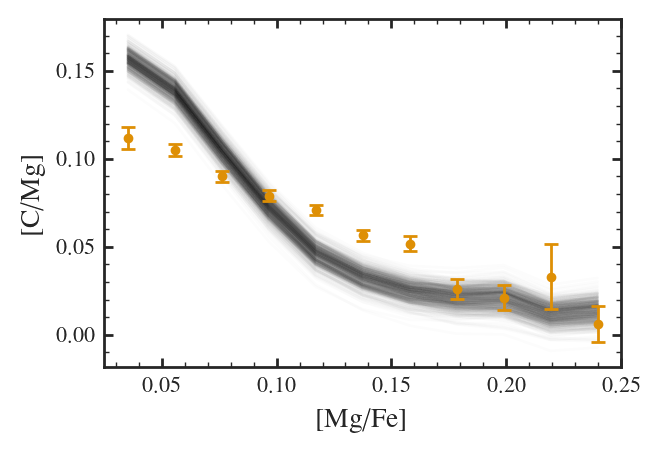

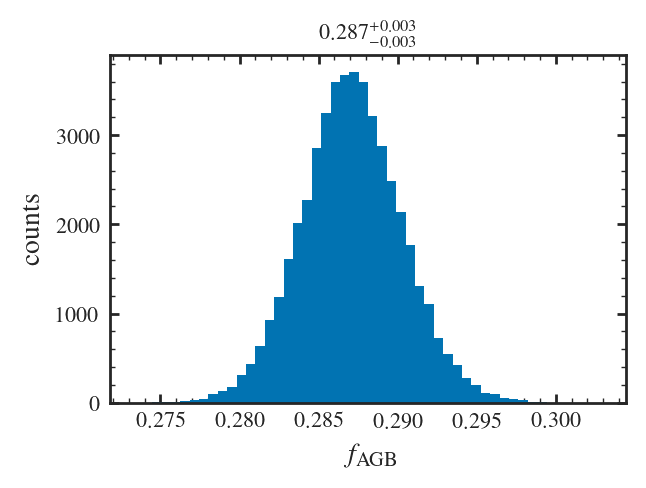

In [70]:
plot_all("fruity_mf0.5", yagb_props["fruity_mf0.5"])

adding  alpha
length of samples =  48000
parameter	 med	 16th	 84th	0.1th	99.9th
y0_cc   	 1.982	-0.020	+0.020	-0.070	+0.067
zeta_cc 	 1.661	-0.139	+0.137	-0.470	+0.453
A_cc    	 3.007	-0.335	+0.331	-1.066	+1.092
sigma_int	 0.095	-0.015	+0.019	-0.038	+0.077
alpha   	 2.110


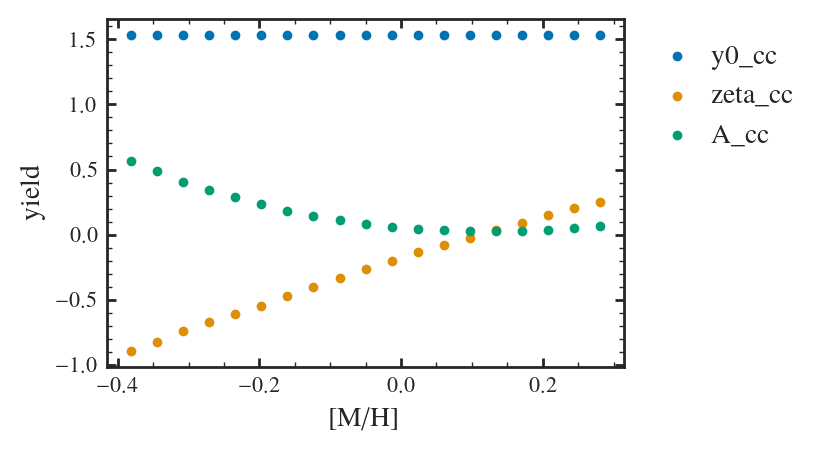

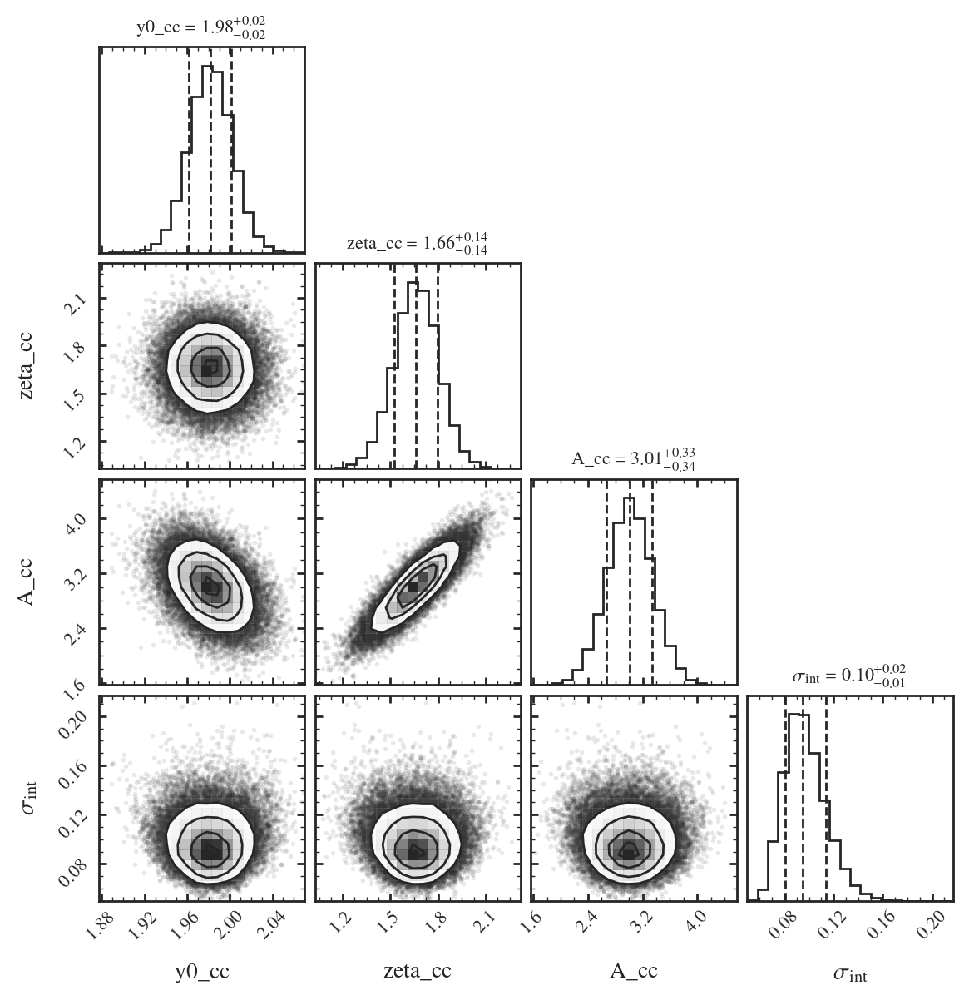

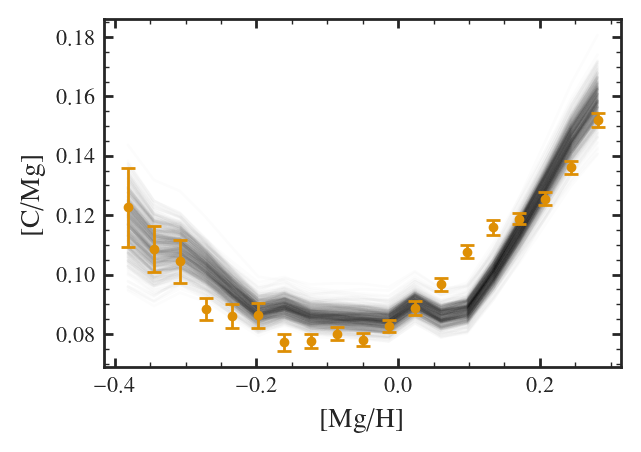

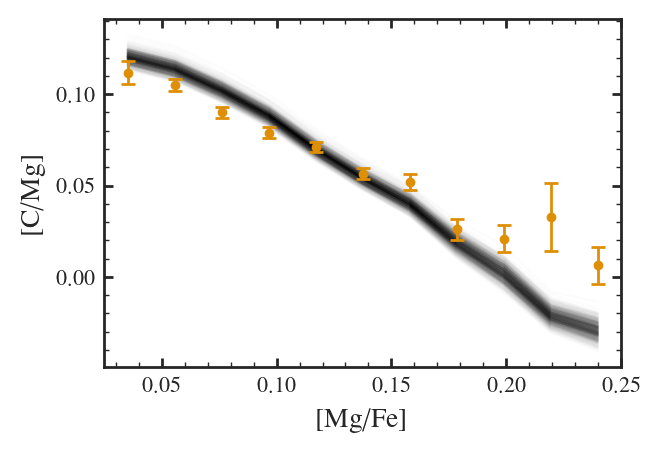

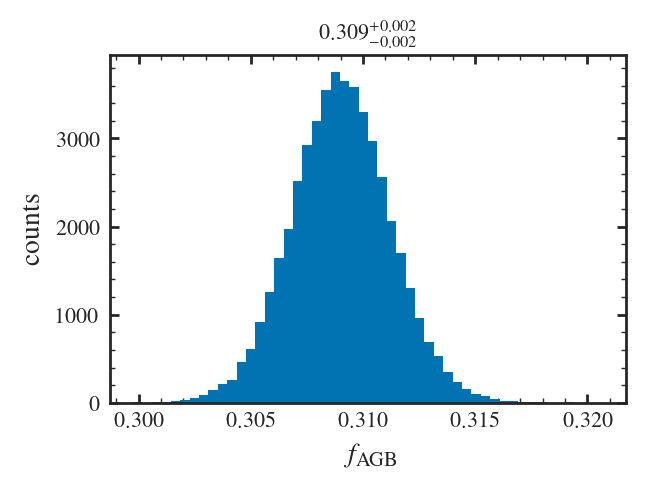

In [71]:
plot_all("fruity_mf0.7", yagb_props["fruity_mf0.7"])

adding  alpha
length of samples =  48000
parameter	 med	 16th	 84th	0.1th	99.9th
y0_cc   	 1.888	-0.034	+0.034	-0.121	+0.113
zeta_cc 	 1.827	-0.232	+0.231	-0.798	+0.733
A_cc    	 1.662	-0.513	+0.512	-1.723	+1.648
sigma_int	 0.175	-0.024	+0.030	-0.062	+0.121
alpha   	 2.600


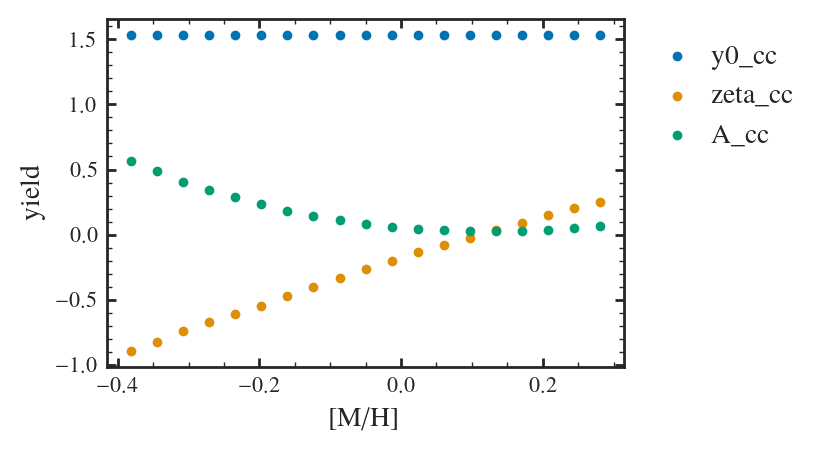

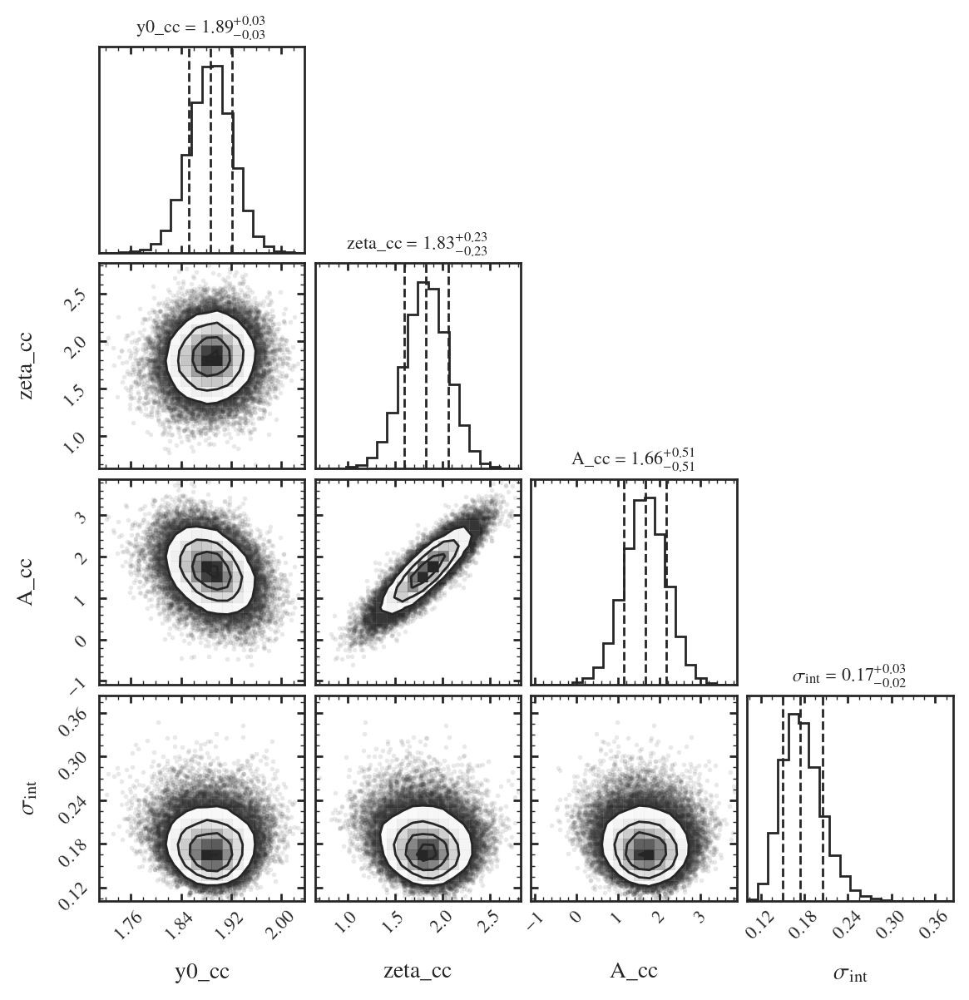

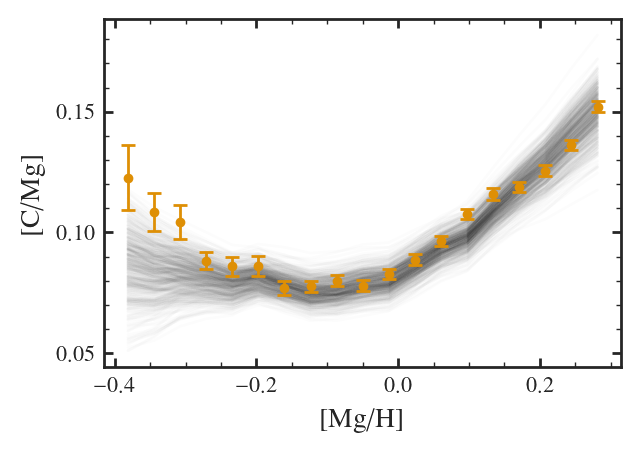

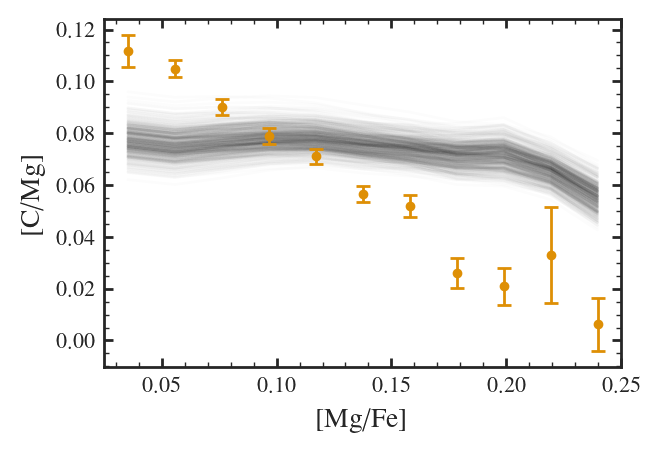

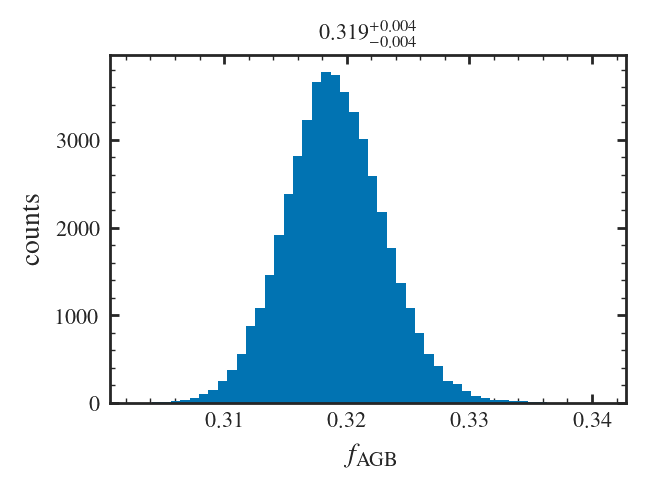

In [72]:
plot_all("fruity_mf1.5", yagb_props["fruity_mf1.5"])

## Agb models

length of samples =  48000
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 2.408	-0.268	+0.260	-0.902	+0.793
y0_cc   	 1.897	-0.094	+0.096	-0.291	+0.324
zeta_cc 	 2.276	-0.158	+0.154	-0.550	+0.518
A_cc    	 2.591	-0.304	+0.303	-0.967	+1.053
sigma_int	 0.085	-0.015	+0.018	-0.037	+0.073


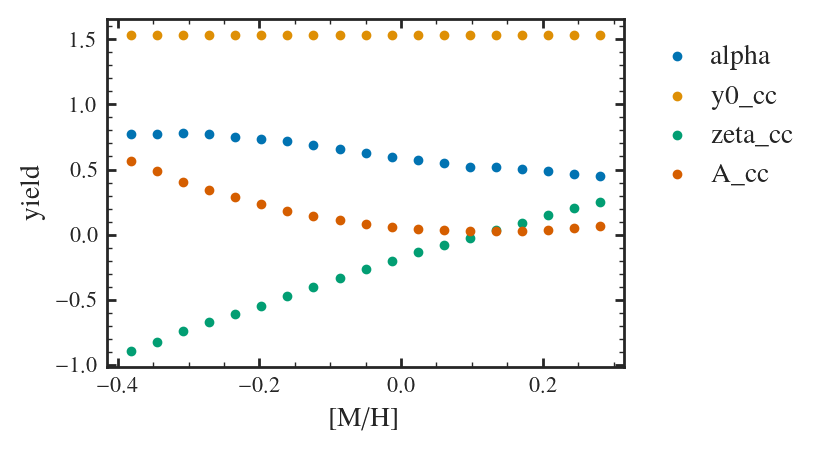

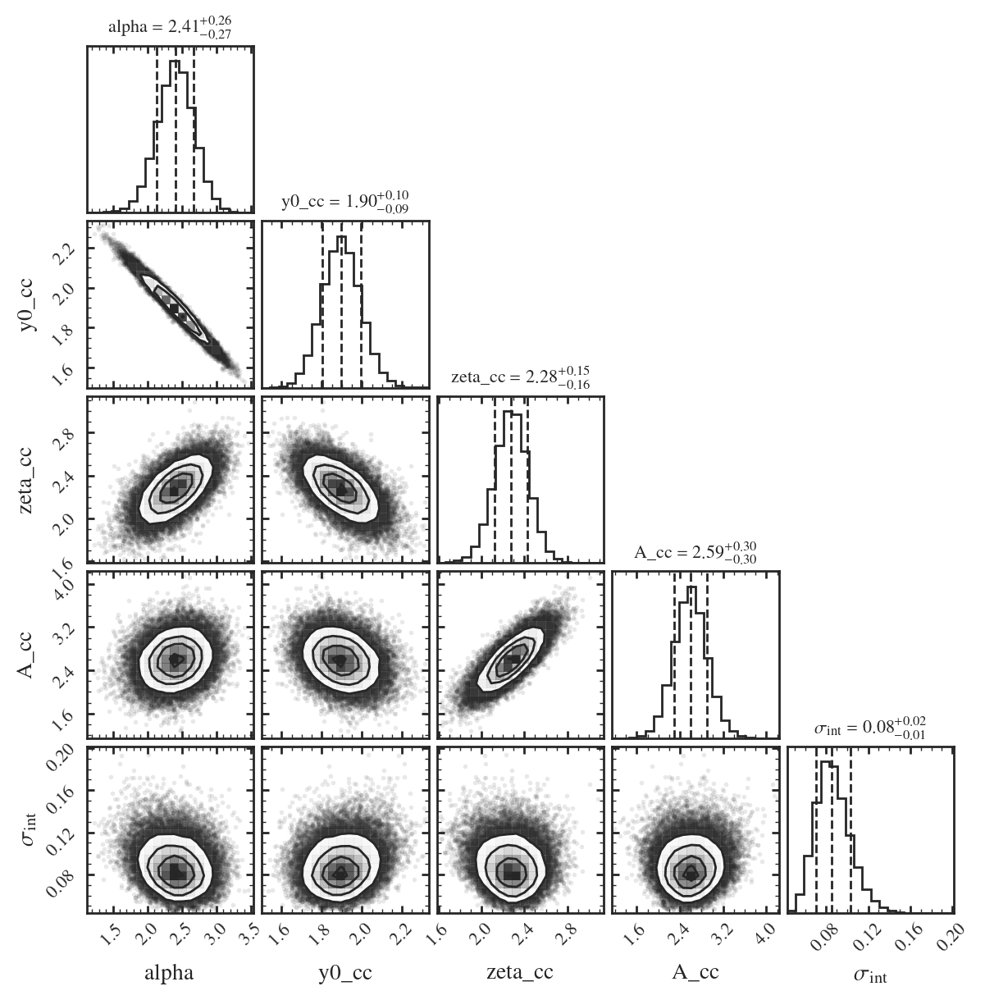

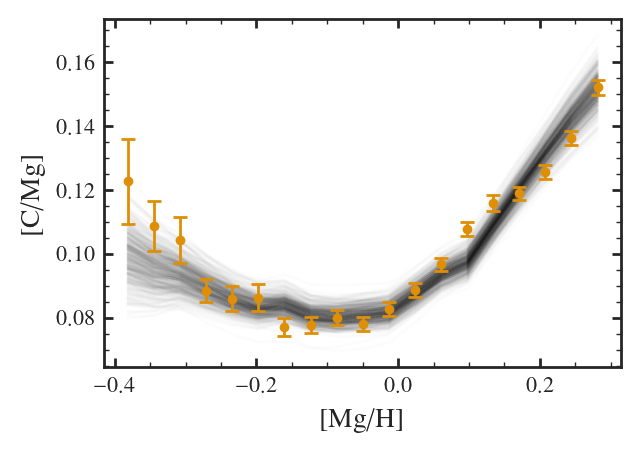

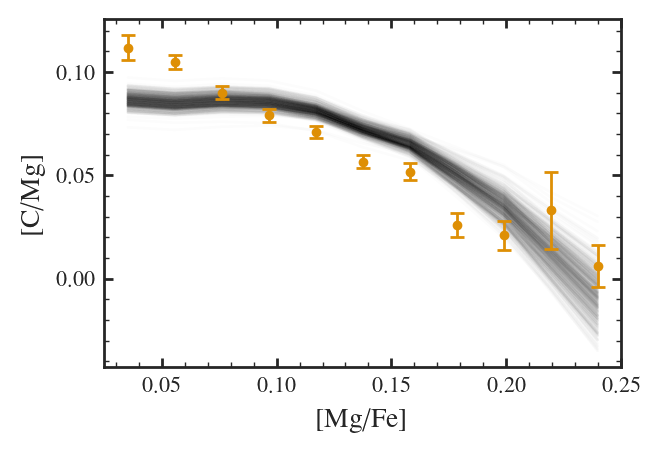

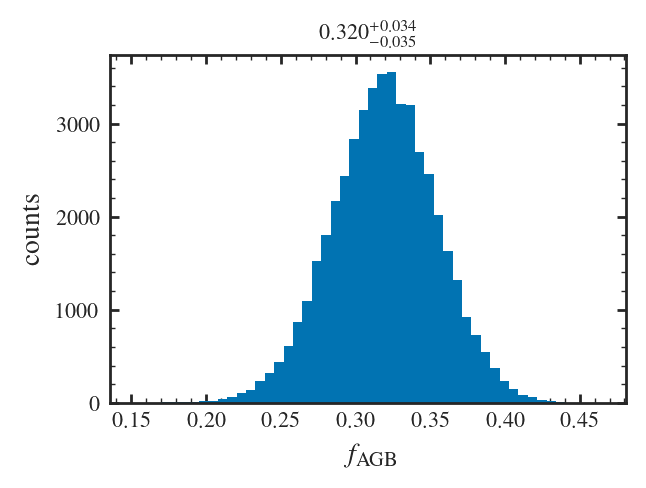

In [79]:
plot_all("fruity_quad", yagb_props["fruity"])

The below are used for alpha lower / higher to set y0, zeta, and alpha

In [ ]:
plot_all("fruity_mf0.7_alpha", yagb_props["fruity_mf0.7"])

In [ ]:
plot_all("fruity_lin", yagb_props["fruity"])

length of samples =  48000
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 1.706	-0.340	+0.342	-1.178	+1.063
y0_cc   	 2.546	-0.048	+0.049	-0.154	+0.164
zeta_cc 	 3.189	-0.399	+0.399	-1.380	+1.258
A_cc    	 1.922	-0.442	+0.447	-1.438	+1.533
sigma_int	 0.142	-0.021	+0.026	-0.054	+0.104


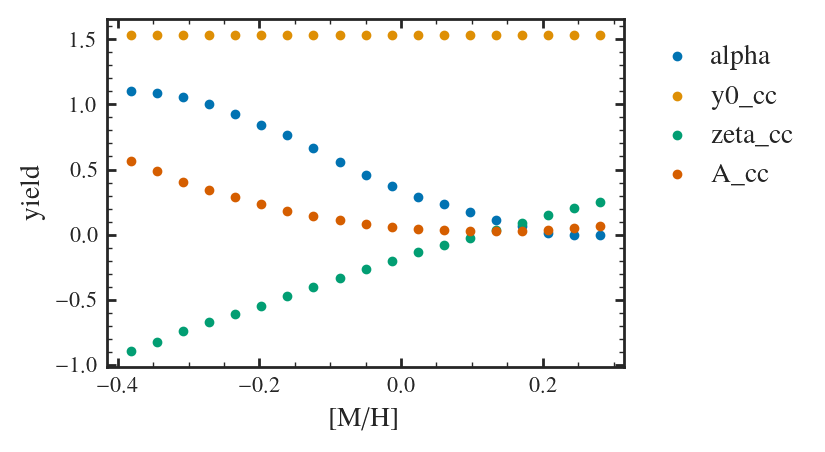

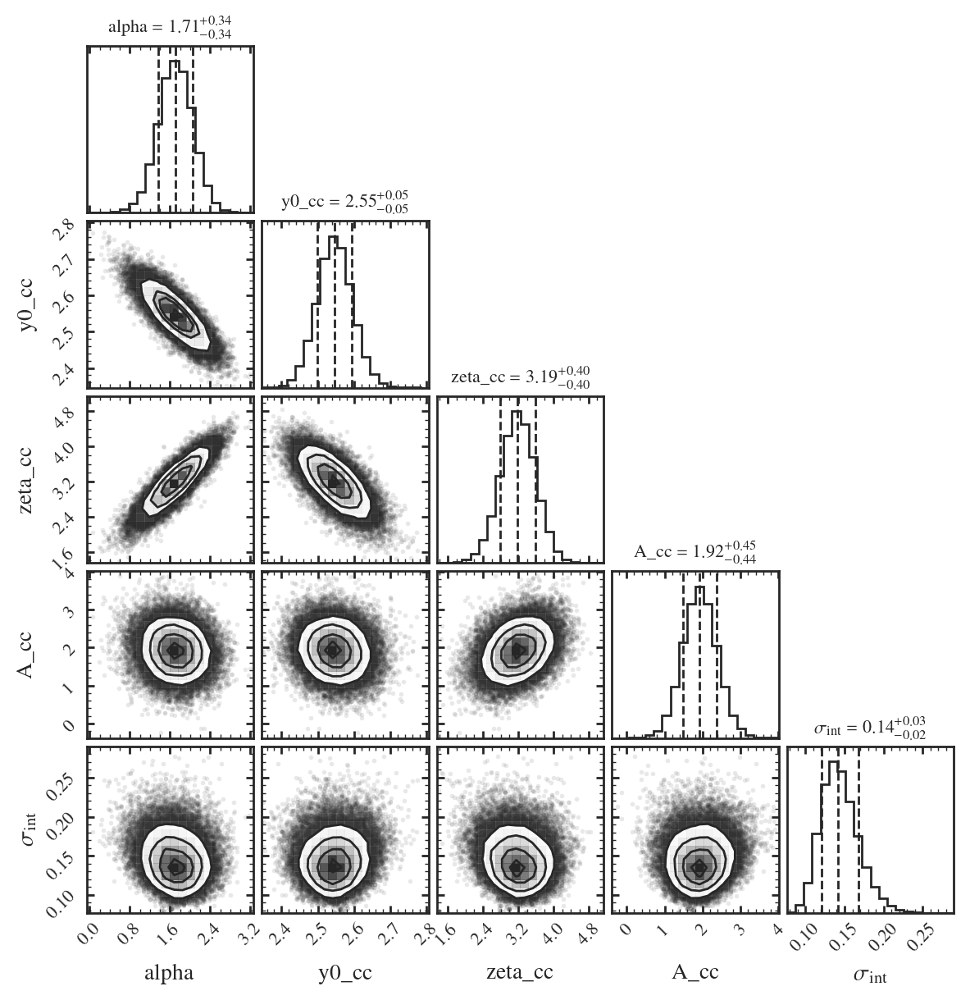

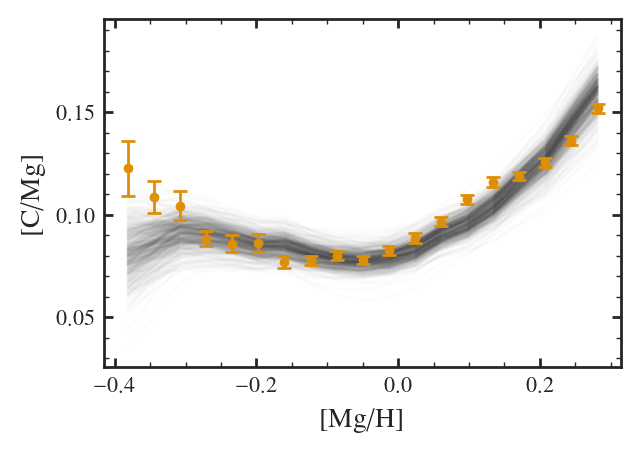

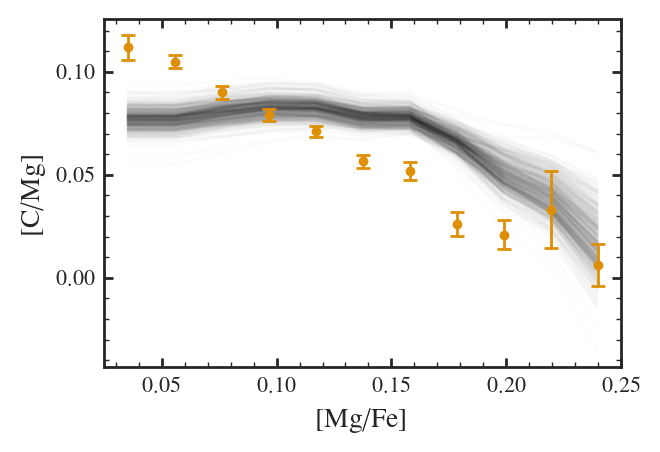

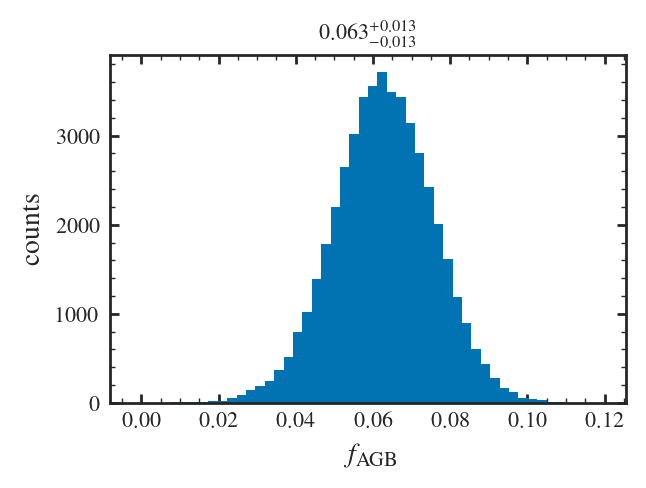

In [80]:
plot_all("aton_quad", yagb_props["aton"])

length of samples =  48000
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 2.062	-0.536	+0.522	-1.772	+1.562
y0_cc   	 2.029	-0.183	+0.189	-0.549	+0.609
zeta_cc 	 3.815	-0.661	+0.642	-2.151	+1.891
A_cc    	 3.484	-0.586	+0.573	-2.005	+1.794
sigma_int	 0.153	-0.023	+0.028	-0.060	+0.115


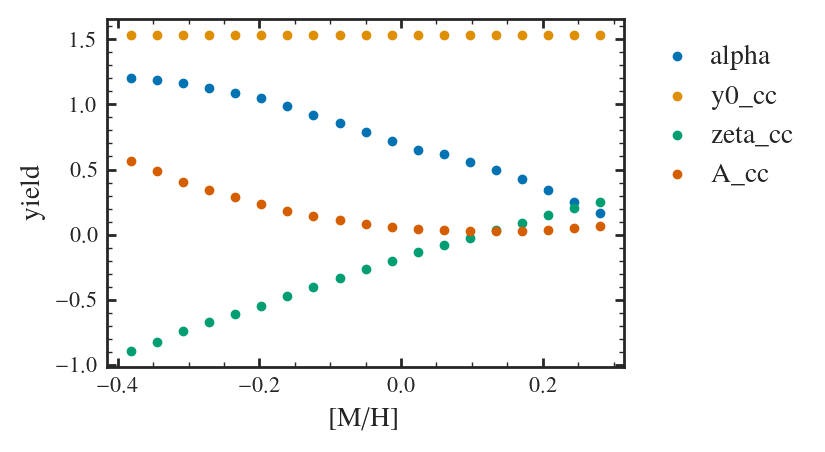

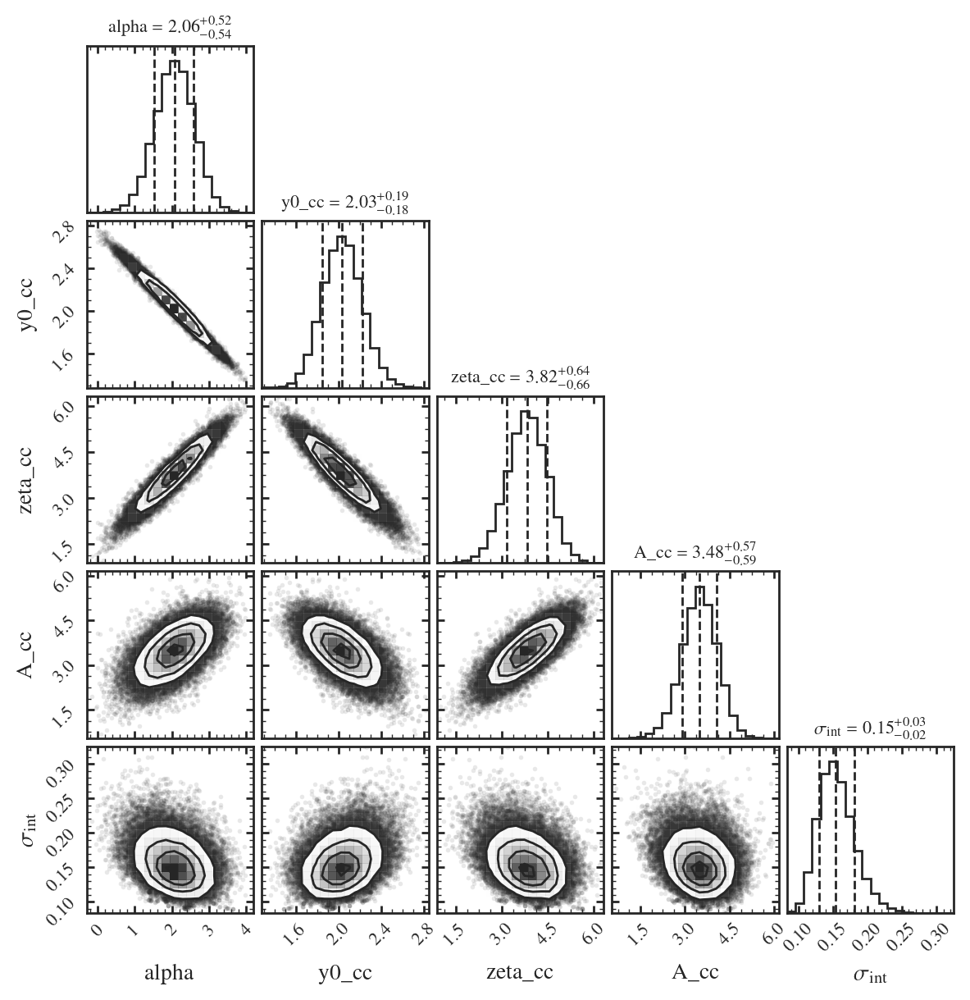

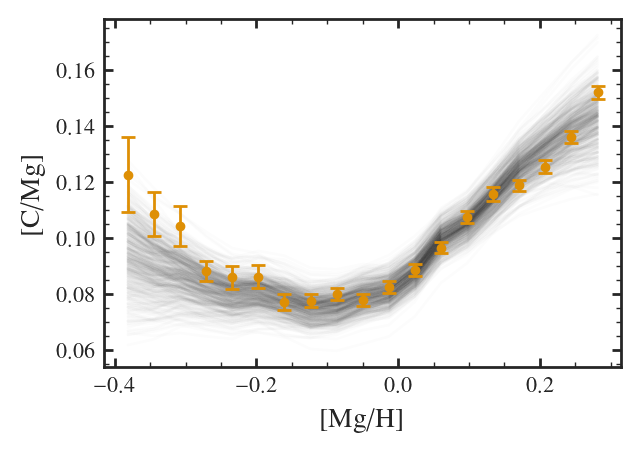

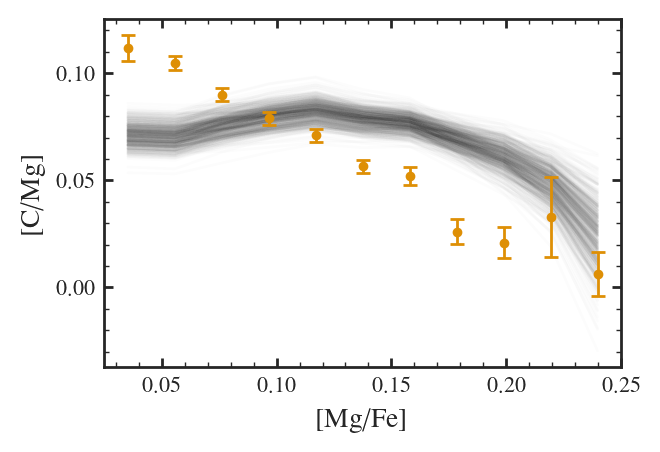

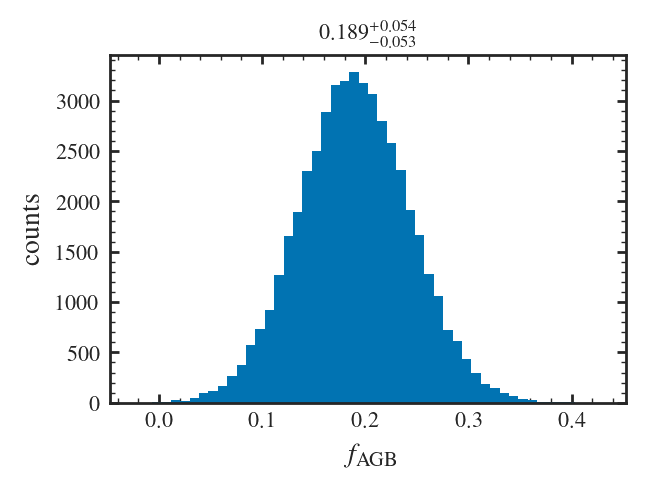

In [81]:
plot_all("monash_quad", yagb_props["monash"])

length of samples =  48000
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 1.211	-0.112	+0.111	-0.367	+0.351
y0_cc   	 1.576	-0.109	+0.111	-0.354	+0.359
zeta_cc 	 1.578	-0.105	+0.108	-0.367	+0.361
A_cc    	 3.158	-0.275	+0.289	-0.893	+0.984
sigma_int	 0.069	-0.013	+0.015	-0.031	+0.063


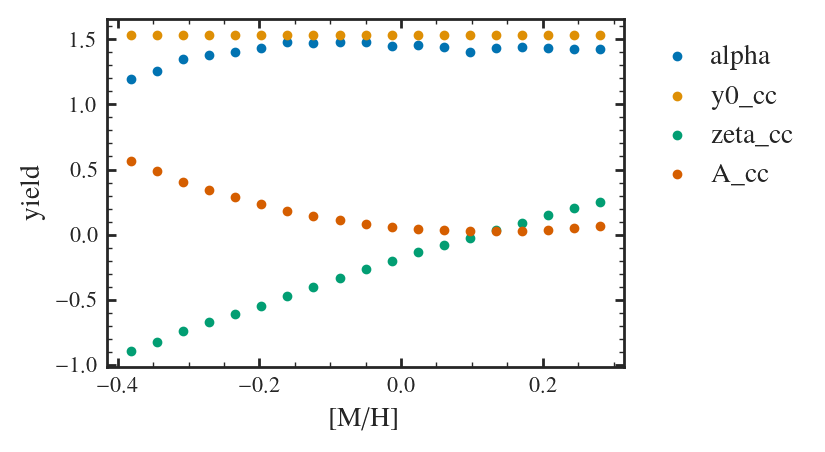

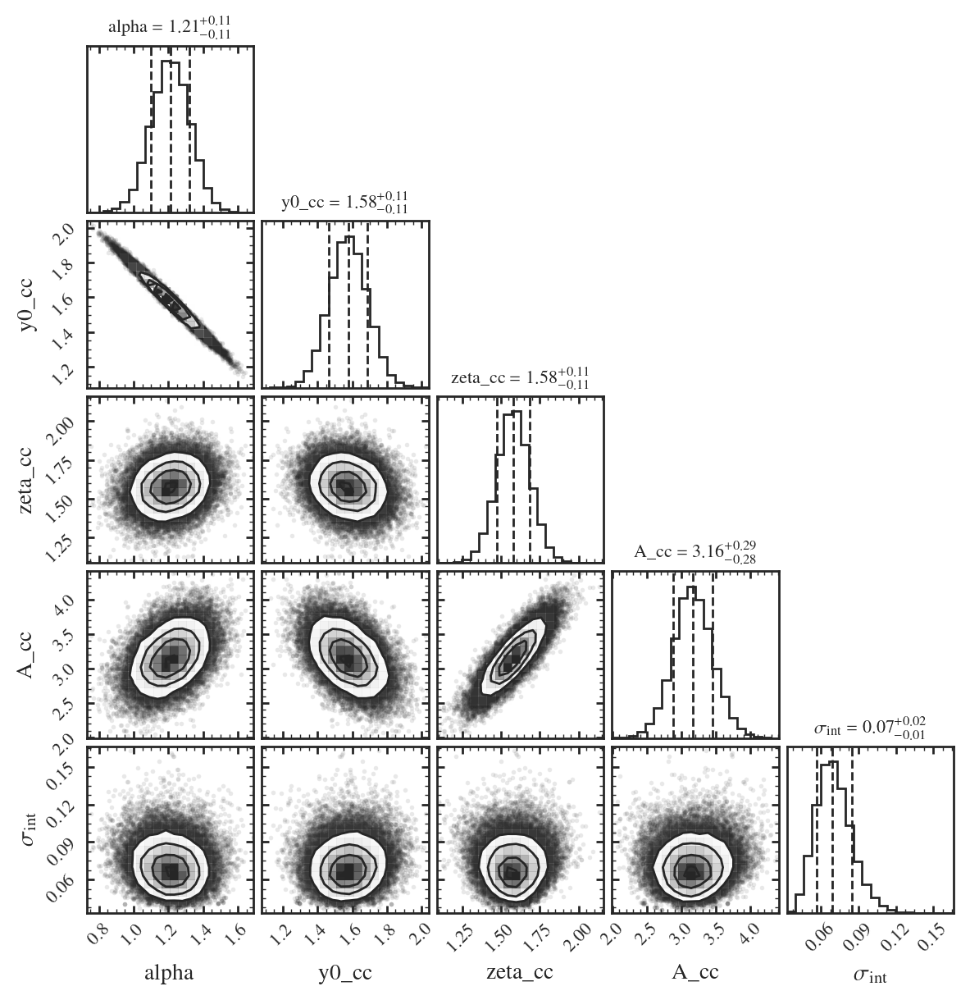

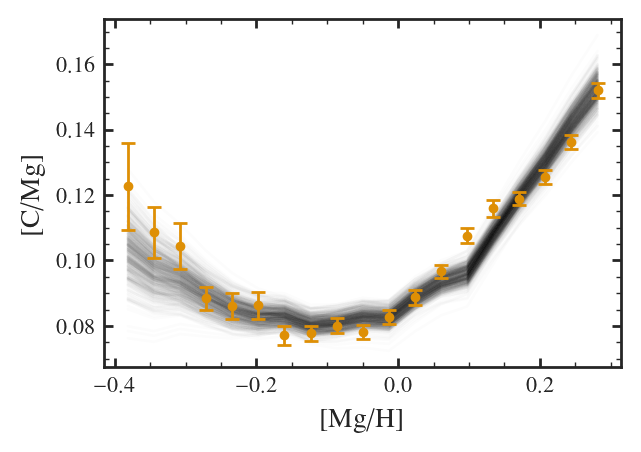

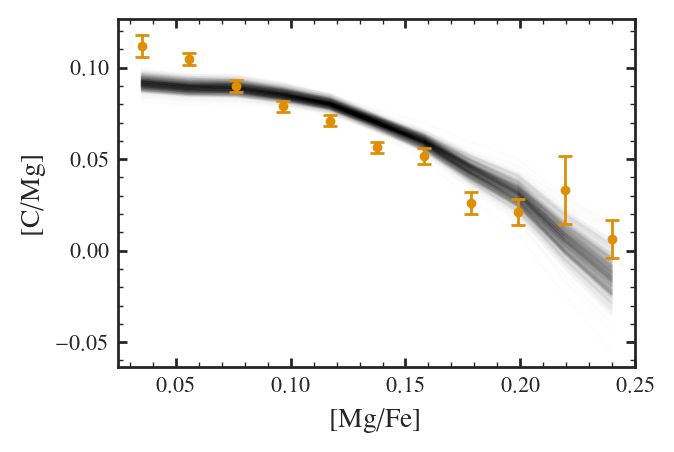

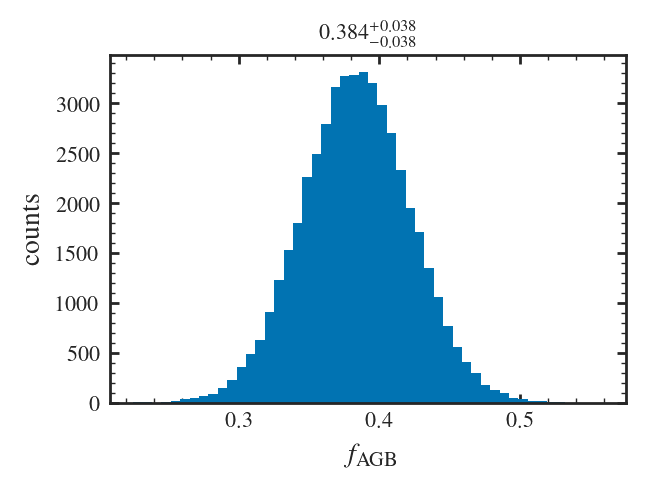

In [82]:
plot_all("nugrid_quad", yagb_props["nugrid"])

## Other analytic

length of samples =  48000
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 1.021	-0.067	+0.071	-0.212	+0.240
y0_cc   	 4.459	-0.070	+0.066	-0.238	+0.210
zeta_cc 	 2.646	-0.108	+0.104	-0.400	+0.355
A_cc    	 5.683	-0.438	+0.436	-1.484	+1.420
sigma_int	 0.039	-0.009	+0.011	-0.030	+0.042


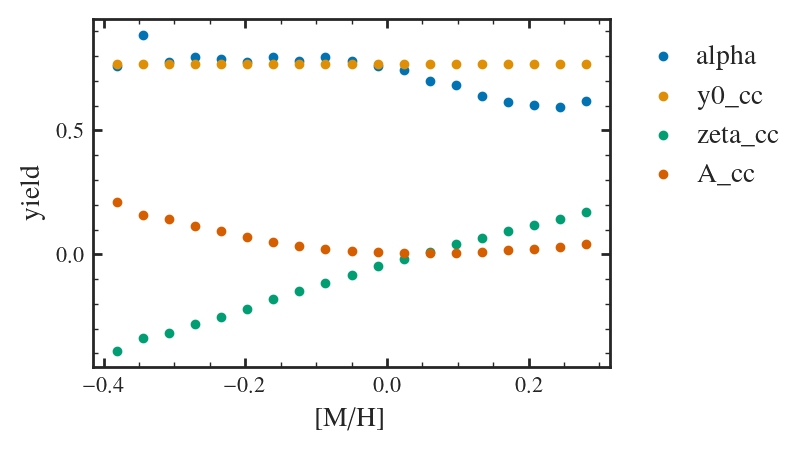

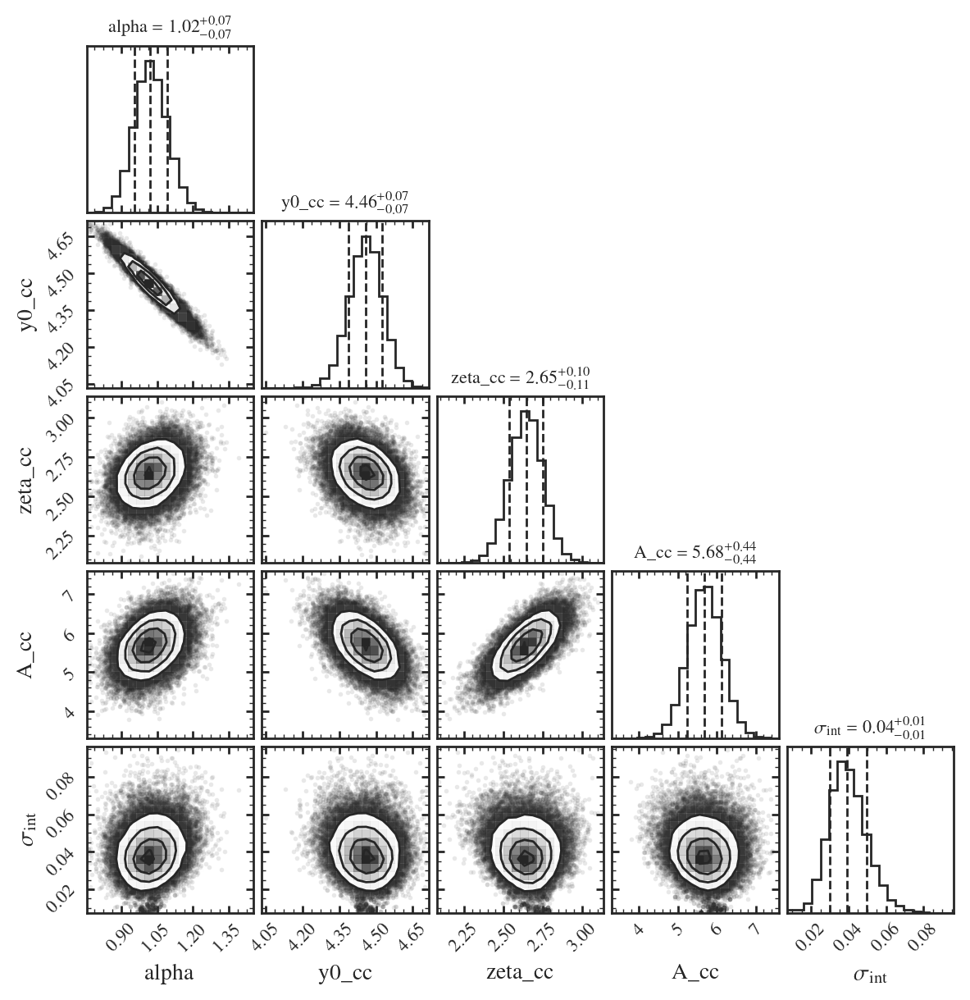

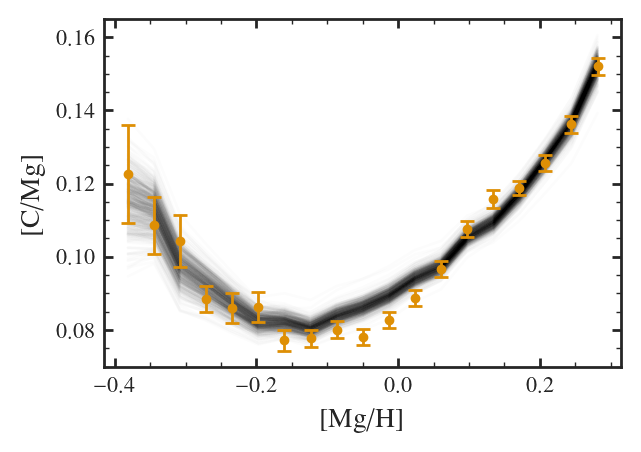

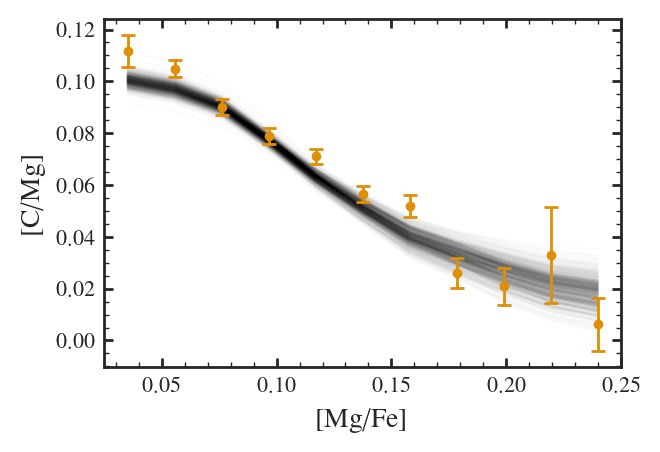

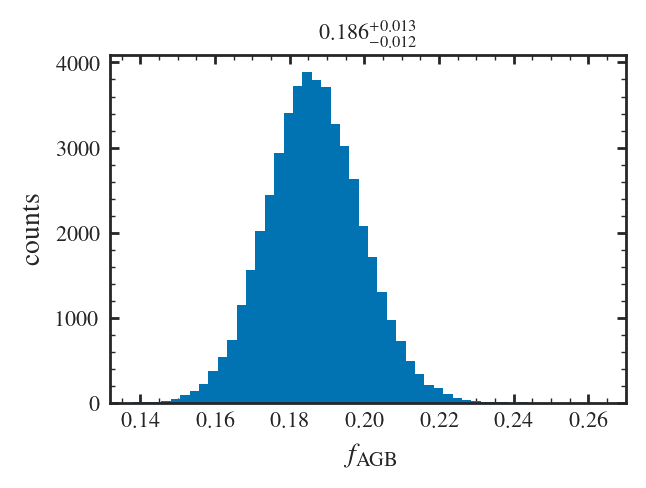

In [73]:
plot_all("analytic_eta2", yagb_props["analytic"])

length of samples =  48000
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 0.616	-0.073	+0.072	-0.237	+0.232
y0_cc   	 2.271	-0.065	+0.066	-0.213	+0.216
zeta_cc 	 2.390	-0.290	+0.276	-0.997	+0.924
A_cc    	 3.969	-0.602	+0.588	-2.053	+1.922
sigma_int	 0.102	-0.015	+0.019	-0.041	+0.078


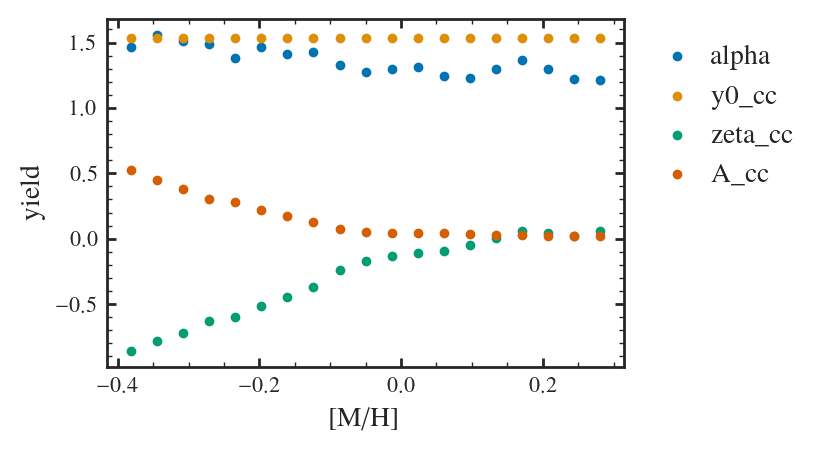

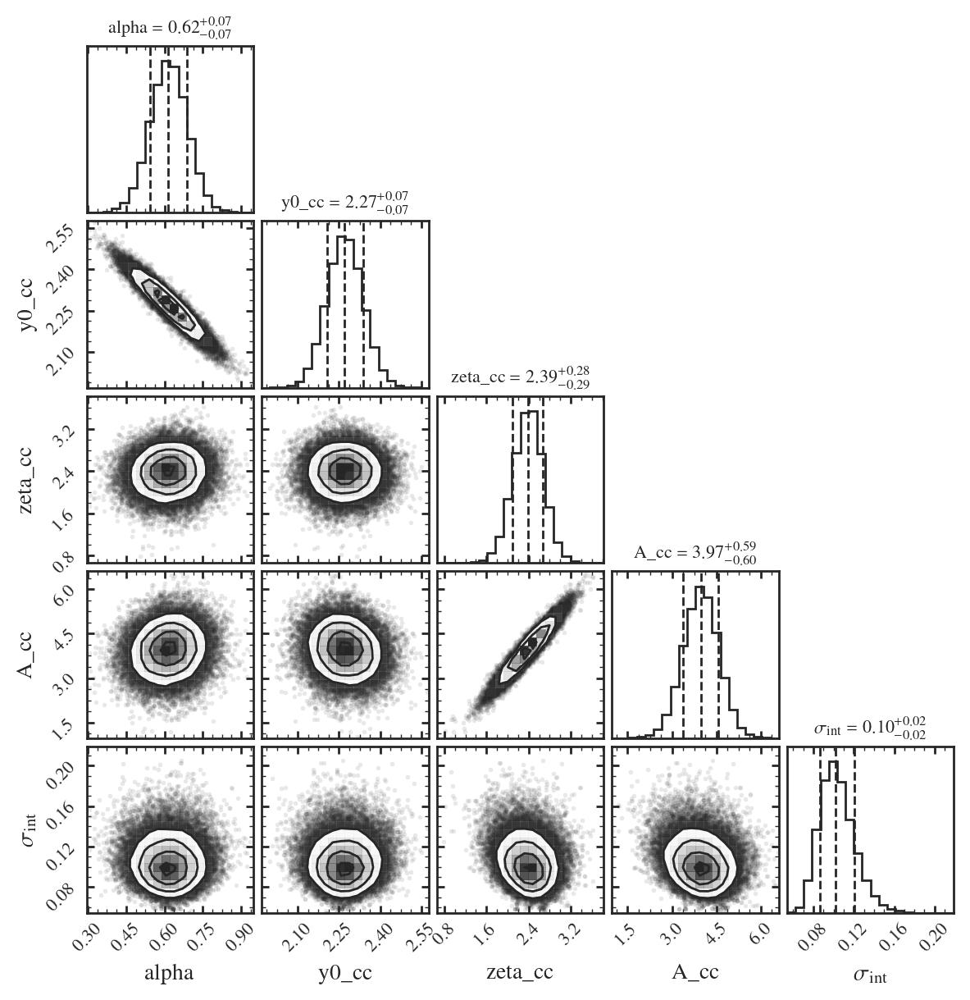

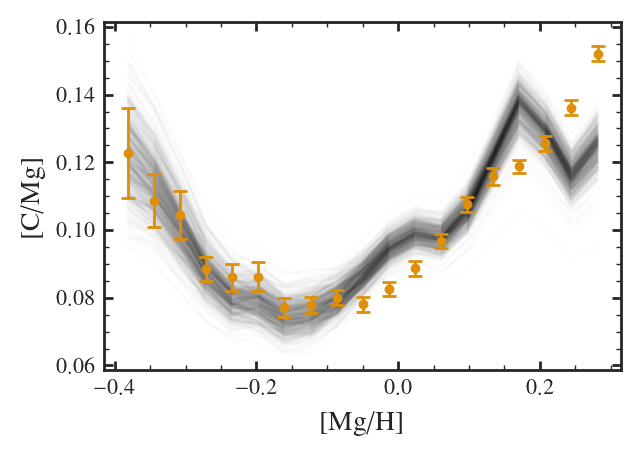

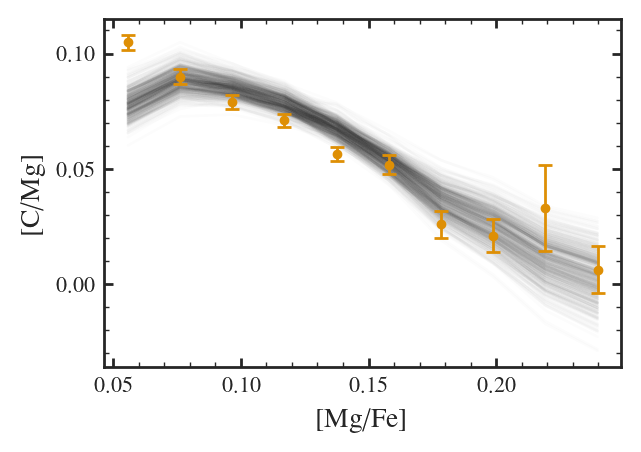

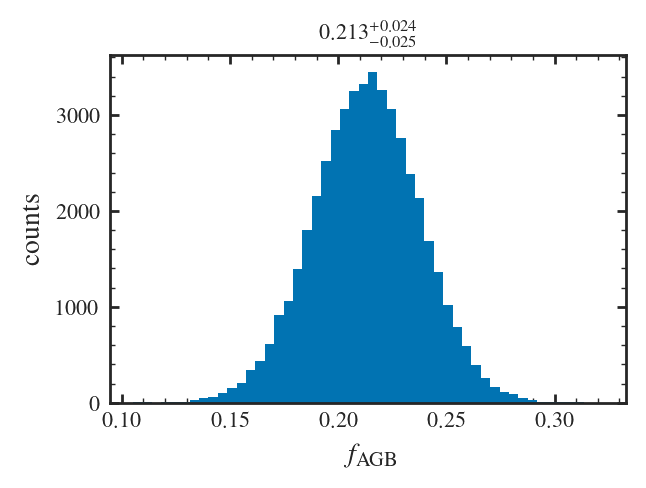

In [76]:
plot_all("analytic_lateburst", yagb_props["analytic"])

length of samples =  48000
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	 0.561	-0.057	+0.058	-0.188	+0.187
y0_cc   	 2.263	-0.055	+0.053	-0.175	+0.173
zeta_cc 	 1.963	-0.184	+0.187	-0.606	+0.616
A_cc    	 3.246	-0.342	+0.352	-1.126	+1.185
sigma_int	 0.088	-0.014	+0.017	-0.036	+0.068


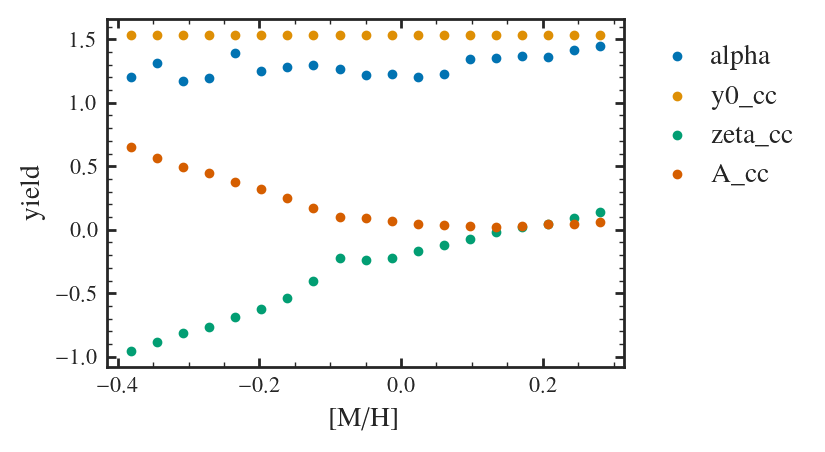

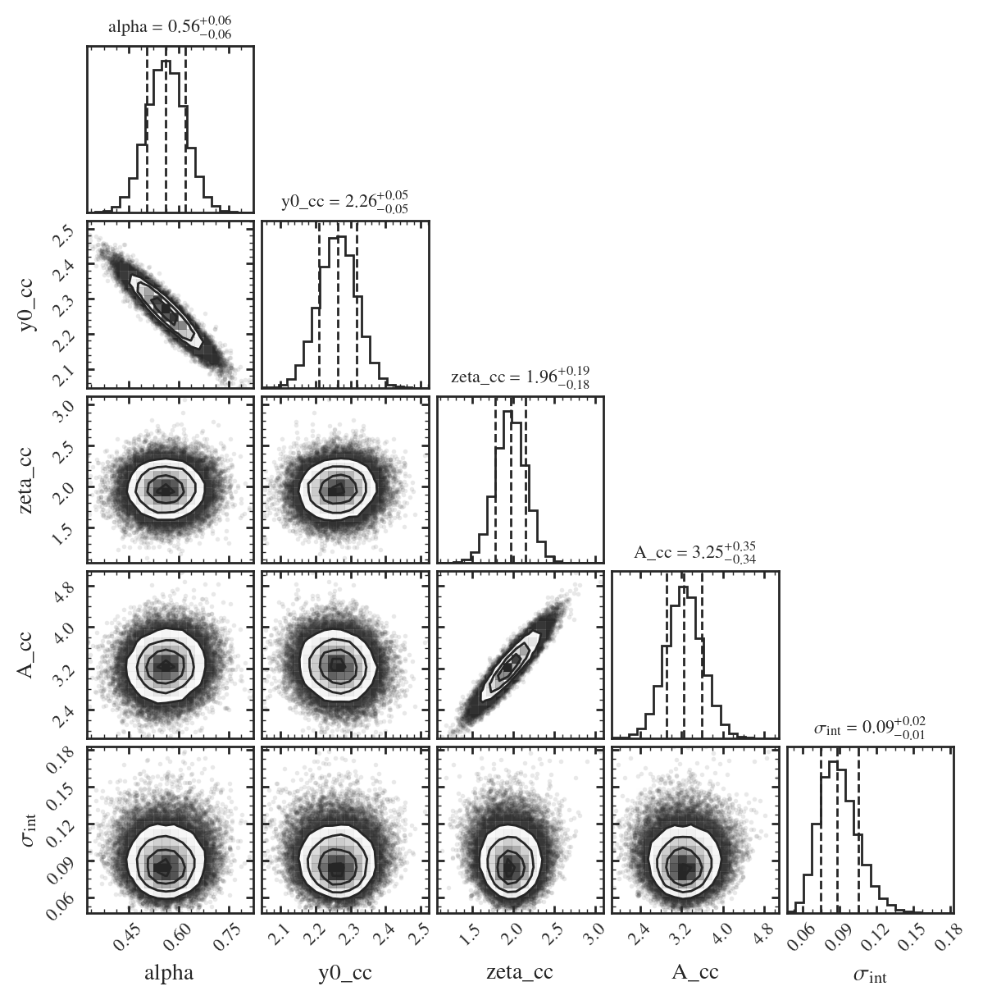

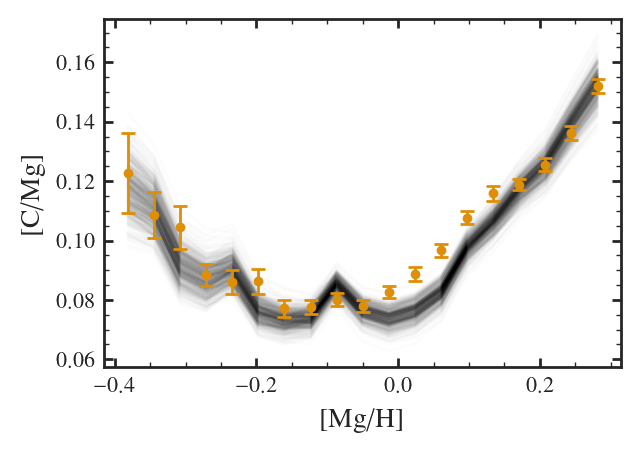

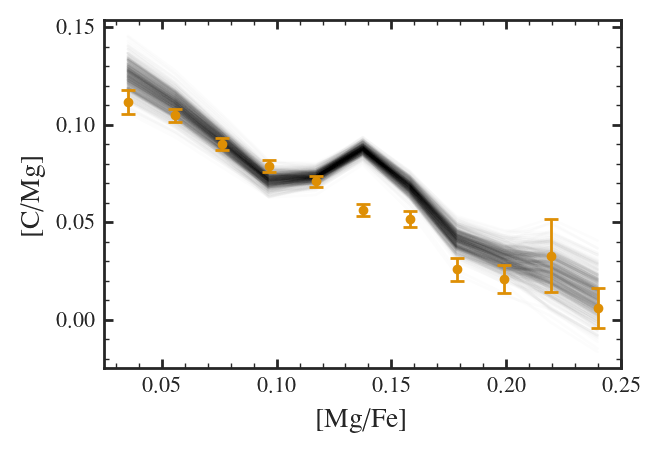

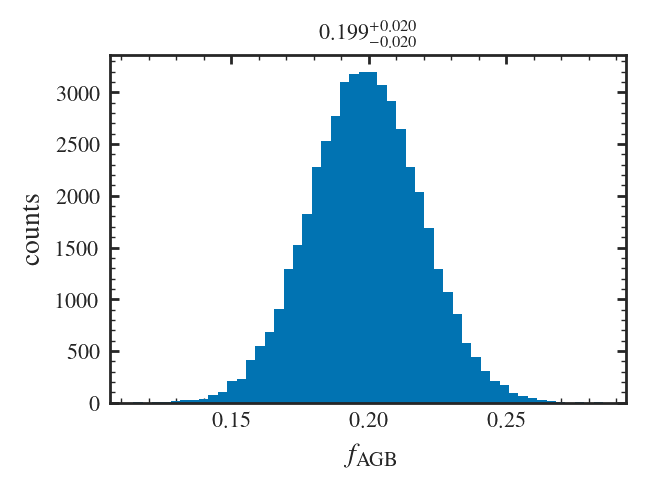

In [75]:
plot_all("analytic_twoinfall_liam", yagb_props["analytic"])

length of samples =  160000
parameter	 med	 16th	 84th	0.1th	99.9th
alpha   	-0.272	-0.092	+0.093	-0.288	+0.292
y0_cc   	 2.994	-0.088	+0.087	-0.279	+0.273
zeta_cc 	 1.398	-0.040	+0.040	-0.121	+0.124
A_cc    	 2.637	-0.123	+0.123	-0.379	+0.385


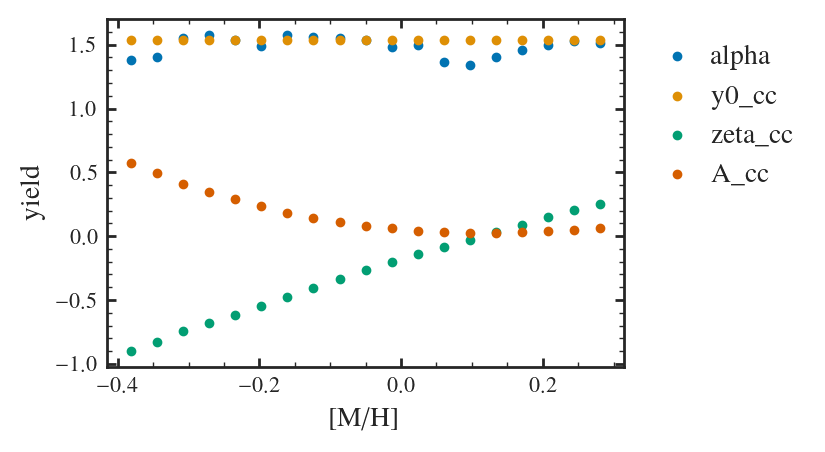

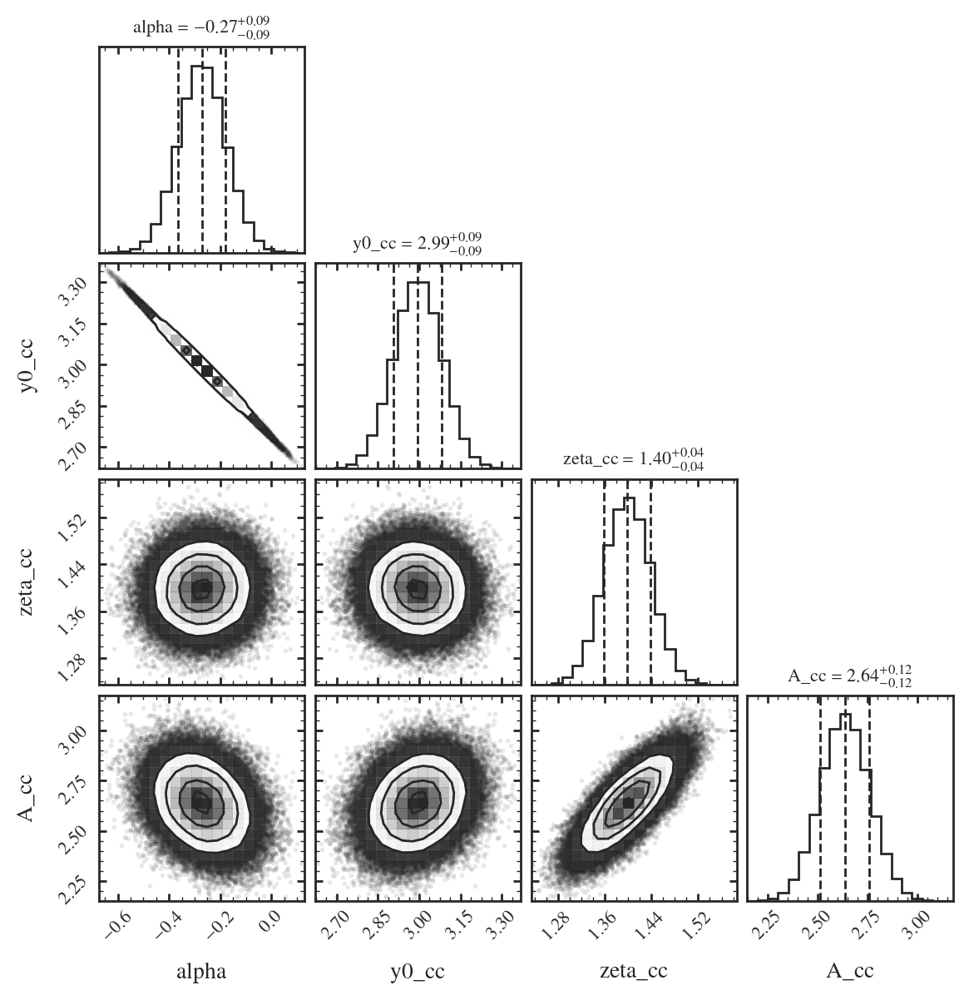

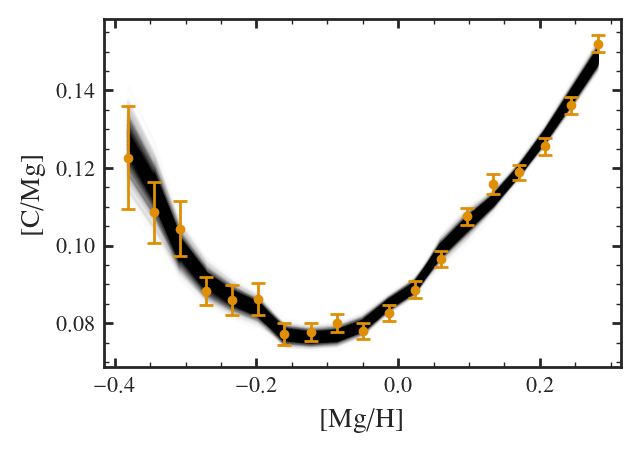

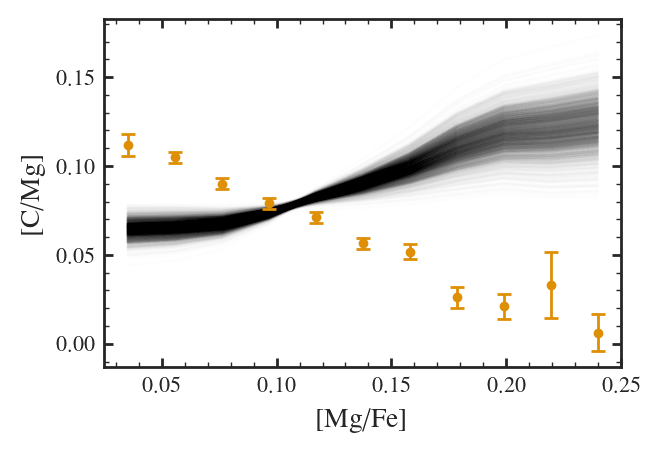

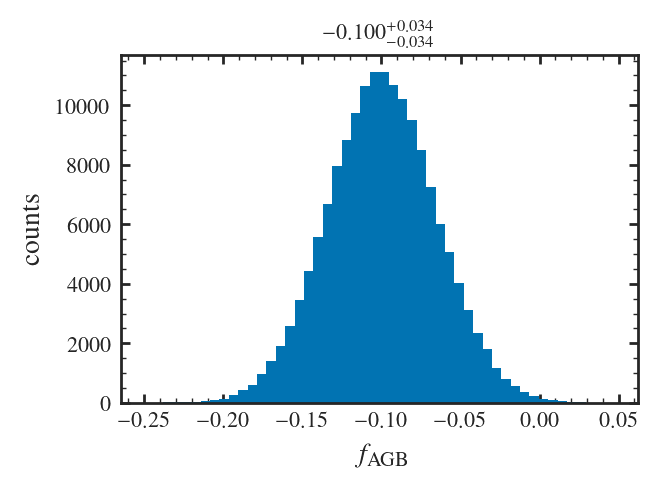

In [77]:
plot_all("analytic_caah_only", yagb_props["analytic"])

## OOb AGBS

In [ ]:
oob_results = {}

In [ ]:
oob_results["fruity"] = plot_all("fruity_oob", y0=3.229e-4, y_a=3.82e-4, zeta_a=-3.5e-4)

In [ ]:
oob_results["aton"] = plot_all("aton_oob",  y0=0.285e-4, y_a=1.85e-4, zeta_a=-9.4e-5)

In [ ]:
oob_results["monash"] = plot_all("monash_oob", y0=3.444e-4, y_a=2.8e-4, zeta_a=-10.1e-4)

In [ ]:
oob_results["nugrid"] = plot_all("nugrid_oob",  y0=10.95e-4, y_a=5.9e-4, zeta_a=-5.7e-4)

### mass shifts

## Extra

In [ ]:
results["analytic_lin"] = plot_all("analytic_lin", y0=1e-3, y_a=1e-3, zeta_a=-1e-3)

In [ ]:
plot_all("analytic_quad_m0.2", y0=1e-3, y_a=1e-3, zeta_a=-1e-3)

In [ ]:
results["fruity_mh0.2"] = plot_all("fruity_mh0.2", y0=3.229e-4, y_a=3.8e-4, zeta_a=-3.5e-4)

In [ ]:
y = surp.yield_models.Quadratic_CC(y0=0.25e-3, zeta=1e-3, A=1e-3, Z1=0.016*10**-0.5)

In [ ]:
y(0.016 * 10**-0.0)

In [ ]:
results["fruity_mh0.5"] = plot_all("fruity_mh0.5", y0=3.229e-4, y_a=3.8e-4, zeta_a=-3.5e-4)

In [32]:
res = results["fruity"]

KeyError: 'fruity'

In [ ]:
res.samples[
    (np.percentile(res.samples.alpha, 99.95) > res.samples.alpha) 
    & (res.samples.alpha > np.percentile(res.samples.alpha, 99.85))].median()

In [ ]:
res.samples[
    (np.percentile(res.samples.alpha, 100 - 99.85) > res.samples.alpha) 
    & (res.samples.alpha > np.percentile(res.samples.alpha, 100 - 99.95))].median()

In [ ]:
ana = results["analytic"]

plot_sample({"alpha": 0.49, "y0_cc": 2.28, "zeta_cc": 1.50, "A_cc": 2.65}, ana.ah, ana.labels, label="mean")
plot_sample({"alpha": 0.49, "y0_cc": 2.28, "zeta_cc": 1.36, "A_cc": 2.65}, ana.ah, ana.labels, label="low z1", linestyle="--")
plot_sample({"alpha": 0.49, "y0_cc": 2.28, "zeta_cc": 1.50, "A_cc": 2.25}, ana.ah, ana.labels, label="low z2", linestyle="--")
plot_sample({"alpha": 0.49, "y0_cc": 2.28, "zeta_cc": 1.36, "A_cc": 2.25}, ana.ah, ana.labels, label="low z1 z2")
plot_sample({"alpha": 0.49, "y0_cc": 2.28, "zeta_cc": 1.60, "A_cc": 3.0}, ana.ah, ana.labels, label="high z1 z2")
plot_obs_caah(ana, color="black")
arya.Legend(-1, color_only=True)

plt.xlabel("[Mg/H]")
plt.ylabel("[C/Mg]")

In [ ]:
ana = results["analytic"]

plot_sample({"alpha": 0.49, "y0_cc": 2.28, "zeta_cc": 1.50, "A_cc": 2.65}, ana.afe, ana.labels, label="mean")
plot_sample({"alpha": 0.49, "y0_cc": 2.28, "zeta_cc": 1.36, "A_cc": 2.25}, ana.afe, ana.labels, label="low z1 z2")
plot_sample({"alpha": 0.49, "y0_cc": 2.28, "zeta_cc": 1.60, "A_cc": 3.0}, ana.afe, ana.labels, label="high z1 z2")
plot_obs_caafe(ana, color="black")
arya.Legend(-1, color_only=True)

plt.xlabel("[Mg/Fe]")
plt.ylabel("[C/Mg]")

## Surveys

In [ ]:
results["v21"] = plot_all("fiducial_vincenzo21", y0=1e-3, y_a=1e-3, zeta_a=-1e-3)

In [ ]:
results["gso"] = plot_all("fiducial_gso", y0=1e-3, y_a=1e-3, zeta_a=-1e-3)

In [ ]:
results["galah"] = plot_all("fiducial_galah", y0=1e-3, y_a=1e-3, zeta_a=-1e-3)

## Test Cases

In [ ]:
test_results = {}

In [ ]:
test_results["NUTS"] = plot_all("NUTS", test=True)

In [ ]:
test_results["HMC"] = plot_all("HMC", test=True)

In [ ]:
test_results["RWMH"] = plot_all("RWMH", test=True)

In [ ]:
test_results["both_sigma"] = plot_all("both_sigma", test=True)

In [ ]:
test_results["fine_bins"] = plot_all("fine_bins", test=True)

In [ ]:
test_results["superfine_bins"] = plot_all("superfine_bins", test=True)

In [ ]:
test_results["both_sigma"] = plot_all("both_sigma", test=True)

In [ ]:
test_results["equal_num_bins"] = plot_all("equal_num_bins", test=True)

In [ ]:
test_results["add_rand_scatter"] = plot_all("add_rand_scatter", test=True)

In [ ]:
test_results["equalnum_fine"] = plot_all("equalnum_fine", test=True)

In [ ]:
test_results["equal_num_bins"] = plot_all("equal_num_bins", test=True)

In [ ]:
test_results["t_test"] = plot_all("t_test", test=True)

In [ ]:
test_results["kstest_samples"] = plot_all("ks_test", test=True)

In [ ]:
test_results["2s"] = plot_all("both_sigma", test=True)